In [1]:
# Installeer alle benodigde libraries in één keer (uitvoeren in een notebook cell)
!pip install opencv-python numpy matplotlib scikit-image scikit-learn tqdm pandas pyyaml ipywidgets

# @title 1. Setup: Installaties en Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog # Voor HOG features
from skimage import exposure
from sklearn.svm import LinearSVC, SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import os
import random
import pickle # Om getrainde modellen op te slaan/laden
from tqdm import tqdm
import pandas as pd # Voor de output tabel
import time
from collections import defaultdict

# Add these new parameters for better classical detection
HARD_NEGATIVE_MINING = True
HARD_NEGATIVE_ITERATIONS = 3  # Number of hard negative mining rounds
BOOTSTRAP_RATIO = 0.3  # Ratio of hard negatives to add each round
MIN_DETECTION_SIZE = (32, 64)  # Minimum person size to detect
MAX_DETECTION_SIZE = (200, 400)  # Maximum person size to detect

# Helper functie om afbeeldingen te tonen
def plot_image(image, title="Image", cmap=None):
    plt.figure(figsize=(8, 6))
    if cmap:
        plt.imshow(image, cmap=cmap)
    else:
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

print("✅ Setup voltooid.")


[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


✅ Setup voltooid.


In [2]:
# @title 2. Configuratie en Pad-instellingen
# ----- Pad naar je dataset (dezelfde als voor YOLO) -----
# We hebben de afbeeldingen nodig, en idealiter ook de (gecorrigeerde) YOLO labels
# om positieve en negatieve samples te kunnen extraheren.
BASE_DATASET_DIR = 'groundingdino_yolo_dataset' # Root van je dataset (waar 'images' en 'labels' in staan)
IMAGE_DIR_TRAIN = os.path.join(BASE_DATASET_DIR, 'images/train')
LABEL_DIR_TRAIN = os.path.join(BASE_DATASET_DIR, 'labels/train')
IMAGE_DIR_VAL = os.path.join(BASE_DATASET_DIR, 'images/val') # Of gebruik de testset voor evaluatie klassiek model
LABEL_DIR_VAL = os.path.join(BASE_DATASET_DIR, 'labels/val')
IMAGE_DIR_TEST = os.path.join(BASE_DATASET_DIR, 'images/test') # Voor de finale tabel
LABEL_DIR_TEST = os.path.join(BASE_DATASET_DIR, 'labels/test')


# ----- Categorieën die we klassiek gaan proberen te detecteren -----
# We beginnen met 'person'
CLASS_NAME_PERSON = "person" # Moet exact overeenkomen met naam in je data.yaml
CLASS_ID_PERSON = None # Wordt opgezocht in data.yaml

# Zoek de class ID voor 'person' uit de data.yaml (als die nog niet geladen is)
# Dit is nodig om de juiste objecten uit de YOLO label files te halen
DATA_YAML_PATH = os.path.join(BASE_DATASET_DIR, 'data.yaml')
if os.path.exists(DATA_YAML_PATH):
    import yaml
    with open(DATA_YAML_PATH, 'r') as f:
        data_config = yaml.safe_load(f)
    CLASS_NAMES_FROM_YAML = data_config.get('names', {})
    for cid, cname in CLASS_NAMES_FROM_YAML.items():
        if cname == CLASS_NAME_PERSON:
            CLASS_ID_PERSON = cid
            break
    if CLASS_ID_PERSON is not None:
        print(f"✅ Klasse '{CLASS_NAME_PERSON}' gevonden met ID: {CLASS_ID_PERSON}")
    else:
        print(f"⚠️ FOUT: Klasse '{CLASS_NAME_PERSON}' niet gevonden in data.yaml!")

✅ Klasse 'person' gevonden met ID: 5


In [3]:
# @title 3. Data Voorbereiding voor HOG+SVM (Personen)

# --- Enhanced Parameters for better classical detection ---
BASE_WINDOW_SIZE = (64, 128)  # Keep standard
HOG_ORIENTATIONS = 9
HOG_PIXELS_PER_CELL = (8, 8)
HOG_CELLS_PER_BLOCK = (2, 2)
HOG_VISUALIZE = False  # Faster training
HOG_FEATURE_VECTOR = True

# Improved sampling parameters
NUM_NEGATIVE_SAMPLES_PER_IMAGE = 20  # More negatives
POSITIVE_AUGMENTATION = True  # Augment positive samples
NEGATIVE_MINING_THRESHOLD = -0.5  # For hard negative mining

def extract_enhanced_samples(image_dir, label_dir, class_id_target, extract_positives=True, 
                           bootstrap_svm=None, max_images=None):
    """Enhanced sample extraction with data augmentation and hard negative mining"""
    local_hog_features = []
    local_labels = []
    images_processed = 0
    
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
    if max_images:
        random.shuffle(image_files)
        image_files = image_files[:max_images]
    
    desc = "Extracting Enhanced Positives" if extract_positives else "Extracting Hard Negatives"
    
    for img_name in tqdm(image_files, desc=desc):
        img_path = os.path.join(image_dir, img_name)
        label_path = os.path.join(label_dir, os.path.splitext(img_name)[0] + '.txt')
        
        image = cv2.imread(img_path)
        if image is None:
            continue
            
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        img_h, img_w = gray_image.shape[:2]
        
        if extract_positives:
            # Extract positive samples with augmentation
            if not os.path.exists(label_path):
                continue
                
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    
                    if class_id == class_id_target:
                        x_center_norm, y_center_norm, w_norm, h_norm = map(float, parts[1:])
                        
                        box_w = int(w_norm * img_w)
                        box_h = int(h_norm * img_h)
                        x_min = max(0, int((x_center_norm * img_w) - (box_w / 2)))
                        y_min = max(0, int((y_center_norm * img_h) - (box_h / 2)))
                        
                        # Original patch
                        patch = gray_image[y_min:min(y_min + box_h, img_h), 
                                         x_min:min(x_min + box_w, img_w)]
                        
                        if patch.size > 0 and patch.shape[0] >= 32 and patch.shape[1] >= 16:
                            # Original patch
                            resized_patch = cv2.resize(patch, BASE_WINDOW_SIZE)
                            fd = hog(resized_patch, orientations=HOG_ORIENTATIONS,
                                   pixels_per_cell=HOG_PIXELS_PER_CELL,
                                   cells_per_block=HOG_CELLS_PER_BLOCK,
                                   visualize=False, feature_vector=True, transform_sqrt=True)
                            local_hog_features.append(fd)
                            local_labels.append(1)
                            
                            # Data augmentation for positives
                            if POSITIVE_AUGMENTATION:
                                # Slightly shifted patches
                                for dx, dy in [(-5, 0), (5, 0), (0, -5), (0, 5)]:
                                    shift_x = max(0, min(img_w - box_w, x_min + dx))
                                    shift_y = max(0, min(img_h - box_h, y_min + dy))
                                    
                                    aug_patch = gray_image[shift_y:shift_y + box_h, 
                                                         shift_x:shift_x + box_w]
                                    if aug_patch.shape[0] == box_h and aug_patch.shape[1] == box_w:
                                        aug_resized = cv2.resize(aug_patch, BASE_WINDOW_SIZE)
                                        aug_fd = hog(aug_resized, orientations=HOG_ORIENTATIONS,
                                                   pixels_per_cell=HOG_PIXELS_PER_CELL,
                                                   cells_per_block=HOG_CELLS_PER_BLOCK,
                                                   visualize=False, feature_vector=True, transform_sqrt=True)
                                        local_hog_features.append(aug_fd)
                                        local_labels.append(1)
                                
                                # Brightness variations
                                for gamma in [0.8, 1.2]:
                                    gamma_patch = np.power(resized_patch / 255.0, gamma)
                                    gamma_patch = (gamma_patch * 255).astype(np.uint8)
                                    gamma_fd = hog(gamma_patch, orientations=HOG_ORIENTATIONS,
                                                 pixels_per_cell=HOG_PIXELS_PER_CELL,
                                                 cells_per_block=HOG_CELLS_PER_BLOCK,
                                                 visualize=False, feature_vector=True, transform_sqrt=True)
                                    local_hog_features.append(gamma_fd)
                                    local_labels.append(1)
        
        else:
            # Extract negative samples (improved strategy)
            target_boxes = []
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        x_center_norm, y_center_norm, w_norm, h_norm = map(float, parts[1:])
                        box_w = int(w_norm * img_w)
                        box_h = int(h_norm * img_h)
                        x_min = int((x_center_norm * img_w) - (box_w / 2))
                        y_min = int((y_center_norm * img_h) - (box_h / 2))
                        target_boxes.append((x_min, y_min, x_min + box_w, y_min + box_h))
            
            samples_per_image = NUM_NEGATIVE_SAMPLES_PER_IMAGE
            if bootstrap_svm:  # Hard negative mining
                samples_per_image *= 2  # Extract more candidates for hard negative mining
            
            for _ in range(samples_per_image):
                attempts = 0
                while attempts < 50:  # More attempts for better negatives
                    attempts += 1
                    
                    # Random window that looks like detection windows
                    rand_x = random.randint(0, max(0, img_w - BASE_WINDOW_SIZE[0]))
                    rand_y = random.randint(0, max(0, img_h - BASE_WINDOW_SIZE[1]))
                    
                    patch_coords = (rand_x, rand_y, 
                                  rand_x + BASE_WINDOW_SIZE[0], 
                                  rand_y + BASE_WINDOW_SIZE[1])
                    
                    # Check overlap with any object
                    is_overlapping = False
                    for t_box in target_boxes:
                        if not (patch_coords[2] < t_box[0] or patch_coords[0] > t_box[2] or
                                patch_coords[3] < t_box[1] or patch_coords[1] > t_box[3]):
                            is_overlapping = True
                            break
                    
                    if not is_overlapping:
                        patch = gray_image[rand_y:rand_y + BASE_WINDOW_SIZE[1],
                                         rand_x:rand_x + BASE_WINDOW_SIZE[0]]
                        
                        if patch.shape == BASE_WINDOW_SIZE[::-1]:  # (height, width)
                            fd = hog(patch, orientations=HOG_ORIENTATIONS,
                                   pixels_per_cell=HOG_PIXELS_PER_CELL,
                                   cells_per_block=HOG_CELLS_PER_BLOCK,
                                   visualize=False, feature_vector=True, transform_sqrt=True)
                            
                            # If bootstrap SVM provided, only keep hard negatives
                            if bootstrap_svm:
                                # Scale features
                                scaled_fd = scaler.transform(fd.reshape(1, -1))
                                confidence = bootstrap_svm.decision_function(scaled_fd)[0]
                                
                                # Only keep if it's a hard negative (false positive)
                                if confidence > NEGATIVE_MINING_THRESHOLD:
                                    local_hog_features.append(fd)
                                    local_labels.append(0)
                                    break
                            else:
                                local_hog_features.append(fd)
                                local_labels.append(0)
                                break
        
        images_processed += 1
        if images_processed % 100 == 0:
            print(f"  Processed {images_processed} images, extracted {len(local_labels)} samples")
    
    return np.array(local_hog_features), np.array(local_labels)

# Extract initial positive samples with augmentation
print("\n--- Extracting Enhanced Positive Samples with Augmentation ---")
positive_features, positive_labels = extract_enhanced_samples(
    IMAGE_DIR_TRAIN, LABEL_DIR_TRAIN, CLASS_ID_PERSON, extract_positives=True
)
print(f"✅ {len(positive_features)} positive samples extracted (with augmentation)")

# Extract initial negative samples  
print("\n--- Extracting Initial Negative Samples ---")
negative_features, negative_labels = extract_enhanced_samples(
    IMAGE_DIR_TRAIN, LABEL_DIR_TRAIN, CLASS_ID_PERSON, extract_positives=False, 
    max_images=150  # Limit for initial round
)
print(f"✅ {len(negative_features)} initial negative samples extracted")

# Combine initial data
if len(positive_features) > 0 and len(negative_features) > 0:
    X_initial = np.vstack([positive_features, negative_features])
    y_initial = np.concatenate([positive_labels, negative_labels])
    
    # Shuffle
    shuffle_indices = np.random.permutation(len(X_initial))
    X_initial = X_initial[shuffle_indices]
    y_initial = y_initial[shuffle_indices]
    
    print(f"\nInitial dataset: {X_initial.shape[0]} samples")
    print(f"  Positive: {np.sum(y_initial == 1)}")
    print(f"  Negative: {np.sum(y_initial == 0)}")
else:
    print("❌ Could not extract sufficient samples for training")
    X_initial, y_initial = None, None


--- Extracting Enhanced Positive Samples with Augmentation ---


Extracting Enhanced Positives:  48%|████▊     | 100/209 [00:16<00:21,  5.15it/s]

  Processed 100 images, extracted 1638 samples


Extracting Enhanced Positives:  97%|█████████▋| 202/209 [00:33<00:00, 10.81it/s]

  Processed 200 images, extracted 4361 samples


Extracting Enhanced Positives: 100%|██████████| 209/209 [00:34<00:00,  6.12it/s]



✅ 4655 positive samples extracted (with augmentation)

--- Extracting Initial Negative Samples ---


Extracting Hard Negatives:  67%|██████▋   | 101/150 [00:14<00:07,  6.75it/s]

  Processed 100 images, extracted 1859 samples


Extracting Hard Negatives: 100%|██████████| 150/150 [00:21<00:00,  6.84it/s]



✅ 2820 initial negative samples extracted

Initial dataset: 7475 samples
  Positive: 4655
  Negative: 2820


In [ ]:
# @title 4. Training SVM Classifier (Personen)

# Define the path for saving the SVM model
SVM_MODEL_PATH_PERSON = 'svm_model_person.pkl'

if X_initial is not None:
    print("\n=== ENHANCED SVM TRAINING WITH HARD NEGATIVE MINING ===")
    
    # Initial train/test split
    X_train, X_test, y_train, y_test = train_test_split(
        X_initial, y_initial, test_size=0.2, random_state=42, stratify=y_initial
    )
    
    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    print(f"Initial training set: {X_train_scaled.shape}")
    
    # Store all training data for iterative improvement
    all_train_features = [X_train_scaled]
    all_train_labels = [y_train]
    
    # Iterative hard negative mining
    for iteration in range(HARD_NEGATIVE_ITERATIONS):
        print(f"\n--- Hard Negative Mining Iteration {iteration + 1}/{HARD_NEGATIVE_ITERATIONS} ---")
        
        # Combine all training data so far
        X_combined = np.vstack(all_train_features)
        y_combined = np.concatenate(all_train_labels)
        
        print(f"Current training set size: {len(X_combined)}")
        print(f"  Positive: {np.sum(y_combined == 1)}, Negative: {np.sum(y_combined == 0)}")
        
        # Train SVM on current data
        print("Training SVM...")
        param_grid = {'C': [0.01, 0.1, 1, 10]}
        grid_search = GridSearchCV(
            LinearSVC(random_state=42, max_iter=5000, dual='auto'),
            param_grid, cv=3, scoring='accuracy', verbose=0, n_jobs=-1
        )
        grid_search.fit(X_combined, y_combined)
        current_svm = grid_search.best_estimator_
        
        print(f"Best C: {grid_search.best_params_['C']}")
        print(f"CV Score: {grid_search.best_score_:.3f}")
        
        # Test current SVM
        y_pred = current_svm.predict(X_test_scaled)
        accuracy = accuracy_score(y_test, y_pred)
        print(f"Test accuracy: {accuracy:.3f}")
        
        # Extract hard negatives if not last iteration
        if iteration < HARD_NEGATIVE_ITERATIONS - 1:
            print("Mining hard negatives...")
            hard_neg_features, hard_neg_labels = extract_enhanced_samples(
                IMAGE_DIR_TRAIN, LABEL_DIR_TRAIN, CLASS_ID_PERSON, 
                extract_positives=False, bootstrap_svm=current_svm, max_images=100
            )
            
            if len(hard_neg_features) > 0:
                # Scale the new hard negatives
                hard_neg_scaled = scaler.transform(hard_neg_features)
                all_train_features.append(hard_neg_scaled)
                all_train_labels.append(hard_neg_labels)
                print(f"Added {len(hard_neg_features)} hard negatives")
            else:
                print("No hard negatives found, stopping early")
                break
    
    # Final model
    X_final = np.vstack(all_train_features)
    y_final = np.concatenate(all_train_labels)
    
    print(f"\n=== FINAL MODEL TRAINING ===")
    print(f"Final training set: {len(X_final)} samples")
    print(f"  Positive: {np.sum(y_final == 1)}, Negative: {np.sum(y_final == 0)}")
    
    # Train final SVM with extended parameter search
    final_param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}
    final_grid_search = GridSearchCV(
        LinearSVC(random_state=42, max_iter=10000, dual='auto'),
        final_param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1
    )
    final_grid_search.fit(X_final, y_final)
    svm_model = final_grid_search.best_estimator_
    
    print(f"Final best C: {final_grid_search.best_params_['C']}")
    print(f"Final CV score: {final_grid_search.best_score_:.3f}")
    
    # Final evaluation
    y_pred_final = svm_model.predict(X_test_scaled)
    final_accuracy = accuracy_score(y_test, y_pred_final)
    print(f"Final test accuracy: {final_accuracy:.3f}")
    
    print("\nFinal Classification Report:")
    print(classification_report(y_test, y_pred_final, target_names=['No Person', 'Person']))
    
    # Save models
    with open('svm_model_person_enhanced.pkl', 'wb') as f:
        pickle.dump(svm_model, f)
    with open('scaler_person_enhanced.pkl', 'wb') as f:
        pickle.dump(scaler, f)
    
    print("✅ Enhanced SVM model and scaler saved")
    
else:
    print("❌ Skipping SVM training due to insufficient data")
    svm_model = None


=== ENHANCED SVM TRAINING WITH HARD NEGATIVE MINING ===
Initial training set: (5980, 3780)

--- Hard Negative Mining Iteration 1/3 ---
Current training set size: 5980
  Positive: 3724, Negative: 2256
Training SVM...
Initial training set: (5980, 3780)

--- Hard Negative Mining Iteration 1/3 ---
Current training set size: 5980
  Positive: 3724, Negative: 2256
Training SVM...
Best C: 0.01
CV Score: 0.897
Test accuracy: 0.912
Mining hard negatives...
Best C: 0.01
CV Score: 0.897
Test accuracy: 0.912
Mining hard negatives...


Extracting Hard Negatives: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]

  Processed 100 images, extracted 3222 samples
Added 3222 hard negatives

--- Hard Negative Mining Iteration 2/3 ---
Current training set size: 9202
  Positive: 3724, Negative: 5478
Training SVM...


Best C: 0.01
CV Score: 0.827
Test accuracy: 0.882
Mining hard negatives...


Extracting Hard Negatives: 100%|██████████| 100/100 [01:53<00:00,  1.14s/it]

  Processed 100 images, extracted 3009 samples
Added 3009 hard negatives

--- Hard Negative Mining Iteration 3/3 ---


Current training set size: 12211
  Positive: 3724, Negative: 8487
Training SVM...
Best C: 0.01
CV Score: 0.794
Test accuracy: 0.845

=== FINAL MODEL TRAINING ===
Final training set: 12211 samples
  Positive: 3724, Negative: 8487
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Final best C: 0.001
Final CV score: 0.841
Final test accuracy: 0.841

Final Classification Report:
              precision    recall  f1-score   support

   No Person       0.71      0.99      0.82       564
      Person       0.99      0.75      0.86       931

    accuracy                           0.84      1495
   macro avg       0.85      0.87      0.84      1495
weighted avg       0.88      0.84      0.84      1495

✅ Enhanced SVM model and scaler saved


✅ Enhanced models loaded successfully

🎯 Testing enhanced detection on: groundingdino_yolo_dataset\images/val\20250415_133221.jpg
🔍 Enhanced Detection on groundingdino_yolo_dataset\images/val\20250415_133221.jpg
Image size: (4000, 3000, 3)

--- Scale 1/5: 1.0x ---
  Processing 22,448 windows with step (16, 32)
  Found 242 detections at this scale

--- Scale 2/5: 0.8x ---
  Processing 3,626 windows with step (32, 64)
  Found 242 detections at this scale

--- Scale 2/5: 0.8x ---
  Processing 3,626 windows with step (32, 64)
  Found 47 detections at this scale

--- Scale 3/5: 1.2x ---
  Processing 32,634 windows with step (16, 32)
  Found 47 detections at this scale

--- Scale 3/5: 1.2x ---
  Processing 32,634 windows with step (16, 32)
  Found 414 detections at this scale

--- Scale 4/5: 0.6x ---
  Processing 1,980 windows with step (32, 64)
  Found 414 detections at this scale

--- Scale 4/5: 0.6x ---
  Processing 1,980 windows with step (32, 64)
  Found 17 detections at this scale

---

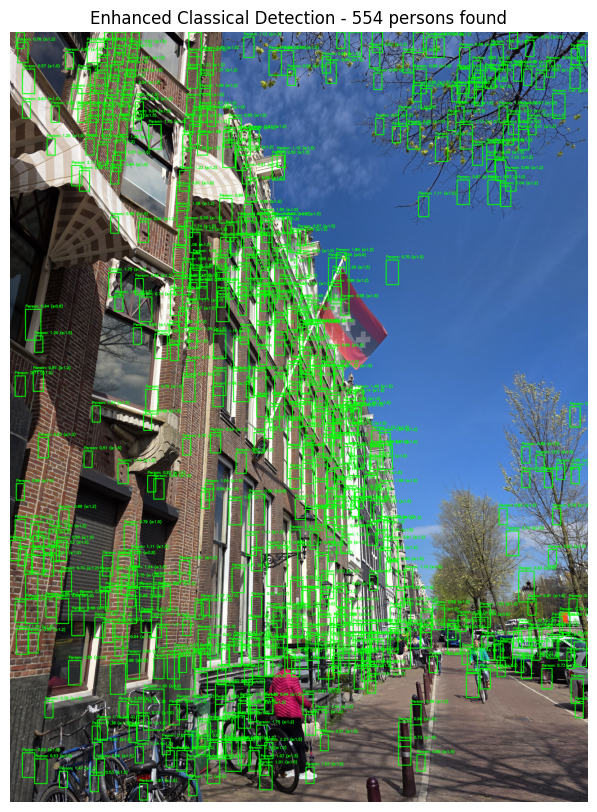

⏱️ Detection completed in 276.0 seconds
🎯 Found 554 people

Detection details:
  1: bbox=(1866,2218,1908,2303), conf=2.874, scale=1.5
  2: bbox=(453,133,506,239), conf=2.777, scale=1.2
  3: bbox=(2760,3093,2813,3199), conf=2.628, scale=1.2
  4: bbox=(597,213,639,298), conf=2.429, scale=1.5
  5: bbox=(1760,2218,1802,2303), conf=2.321, scale=1.5
  6: bbox=(320,693,373,799), conf=2.169, scale=1.2
  7: bbox=(1290,3264,1332,3349), conf=2.078, scale=1.5
  8: bbox=(1093,1066,1146,1172), conf=2.059, scale=1.2
  9: bbox=(1104,3552,1168,3680), conf=2.045, scale=1.0
  10: bbox=(1266,2080,1319,2186), conf=2.045, scale=1.2
  11: bbox=(586,277,628,362), conf=2.040, scale=1.5
  12: bbox=(672,3904,714,3989), conf=1.971, scale=1.5
  13: bbox=(973,533,1026,639), conf=1.941, scale=1.2
  14: bbox=(1386,1120,1439,1226), conf=1.925, scale=1.2
  15: bbox=(1184,960,1226,1045), conf=1.894, scale=1.5
  16: bbox=(1781,1941,1823,2026), conf=1.890, scale=1.5
  17: bbox=(1120,3392,1162,3477), conf=1.817, scale=1.5


In [7]:
# @title 5. Detectie van Personen met HOG+SVM via Sliding Window

# Enhanced detection parameters
MULTI_SCALE_FACTORS = [1.0, 0.8, 1.2, 0.6, 1.5]  # Multiple scales
CONFIDENCE_THRESHOLD = 0.5  # Higher threshold for fewer false positives
STEP_SIZE_FINE = (16, 32)  # Smaller step size for better coverage
STEP_SIZE_COARSE = (32, 64)  # Larger step size for speed
NMS_THRESHOLD = 0.3

# Non-Maximum Suppression function (moved here where it's used)
def non_max_suppression_fast(boxes, scores, overlap_thresh):
    """
    Fast Non-Maximum Suppression.
    boxes: list of (startX, startY, endX, endY)
    scores: list of confidence scores
    overlap_thresh: threshold for IoU
    """
    if len(boxes) == 0:
        return []

    # Convert to numpy arrays
    boxes = np.array(boxes)
    scores = np.array(scores)

    # Initialize the list of picked indices
    pick = []

    # Grab the coordinates of the bounding boxes
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    # Compute the area of the bounding boxes and sort the boxes by scores
    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(scores)  # Sort by score, lowest first

    # Keep looping while some indexes still remain in the indexes list
    while len(idxs) > 0:
        # Grab the last index in the indexes list (highest score) and add to pick
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)

        # Find the largest (x, y) coordinates for the start of the bounding box
        # and the smallest (x, y) coordinates for the end of the bounding box
        xx1 = np.maximum(x1[i], x1[idxs[:last]])
        yy1 = np.maximum(y1[i], y1[idxs[:last]])
        xx2 = np.minimum(x2[i], x2[idxs[:last]])
        yy2 = np.minimum(y2[i], y2[idxs[:last]])

        # Compute the width and height of the overlapping bounding box
        w_overlap = np.maximum(0, xx2 - xx1 + 1)
        h_overlap = np.maximum(0, yy2 - yy1 + 1)

        # Compute the ratio of overlap
        overlap = (w_overlap * h_overlap) / area[idxs[:last]]

        # Delete all indexes from the index list that have an IoU greater than threshold
        idxs = np.delete(idxs, np.concatenate(([last], np.where(overlap > overlap_thresh)[0])))
        
    # Return only the bounding boxes that were picked
    return pick

def enhanced_sliding_window_detection(image_path, svm_model, scaler, visualize=True):
    """Enhanced sliding window detection with multi-scale"""
    
    image = cv2.imread(image_path)
    if image is None:
        return []
    
    original_image = image.copy()
    gray_original = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    all_detections = []
    detection_info = []
    
    print(f"🔍 Enhanced Detection on {image_path}")
    print(f"Image size: {image.shape}")
    
    total_windows = 0
    positive_windows = 0
    
    for scale_idx, scale in enumerate(MULTI_SCALE_FACTORS):
        print(f"\n--- Scale {scale_idx + 1}/{len(MULTI_SCALE_FACTORS)}: {scale:.1f}x ---")
        
        # Resize image
        new_w = int(image.shape[1] * scale)
        new_h = int(image.shape[0] * scale)
        
        if new_w < BASE_WINDOW_SIZE[0] or new_h < BASE_WINDOW_SIZE[1]:
            print(f"  Skipping scale {scale:.1f} - image too small")
            continue
            
        scaled_image = cv2.resize(image, (new_w, new_h))
        scaled_gray = cv2.cvtColor(scaled_image, cv2.COLOR_BGR2GRAY)
        
        # Choose step size based on scale
        step_size = STEP_SIZE_FINE if scale >= 1.0 else STEP_SIZE_COARSE
        
        # Calculate number of windows
        num_windows_x = max(1, (new_w - BASE_WINDOW_SIZE[0]) // step_size[0] + 1)
        num_windows_y = max(1, (new_h - BASE_WINDOW_SIZE[1]) // step_size[1] + 1)
        scale_windows = num_windows_x * num_windows_y
        
        print(f"  Processing {scale_windows:,} windows with step {step_size}")
        
        scale_detections = 0
        
        # Sliding window
        for y in range(0, new_h - BASE_WINDOW_SIZE[1] + 1, step_size[1]):
            for x in range(0, new_w - BASE_WINDOW_SIZE[0] + 1, step_size[0]):
                total_windows += 1
                
                # Extract window
                window = scaled_gray[y:y + BASE_WINDOW_SIZE[1], 
                                   x:x + BASE_WINDOW_SIZE[0]]
                
                if window.shape != BASE_WINDOW_SIZE[::-1]:
                    continue
                
                # Extract HOG features
                fd = hog(window, orientations=HOG_ORIENTATIONS,
                        pixels_per_cell=HOG_PIXELS_PER_CELL,
                        cells_per_block=HOG_CELLS_PER_BLOCK,
                        visualize=False, feature_vector=True, transform_sqrt=True)
                
                # Scale and predict
                scaled_fd = scaler.transform(fd.reshape(1, -1))
                prediction = svm_model.predict(scaled_fd)[0]
                confidence = svm_model.decision_function(scaled_fd)[0]
                
                if prediction == 1 and confidence > CONFIDENCE_THRESHOLD:
                    positive_windows += 1
                    scale_detections += 1
                    
                    # Convert back to original image coordinates
                    orig_x = int(x / scale)
                    orig_y = int(y / scale)
                    orig_w = int(BASE_WINDOW_SIZE[0] / scale)
                    orig_h = int(BASE_WINDOW_SIZE[1] / scale)
                    
                    all_detections.append({
                        'bbox': (orig_x, orig_y, orig_x + orig_w, orig_y + orig_h),
                        'confidence': confidence,
                        'scale': scale
                    })
        
        print(f"  Found {scale_detections} detections at this scale")
    
    print(f"\n📊 Detection Summary:")
    print(f"  Total windows processed: {total_windows:,}")
    print(f"  Positive windows: {positive_windows}")
    print(f"  Raw detections: {len(all_detections)}")
    
    if not all_detections:
        return []
    
    # Apply Non-Maximum Suppression
    print("\n🔄 Applying Non-Maximum Suppression...")
    boxes = [det['bbox'] for det in all_detections]
    scores = [det['confidence'] for det in all_detections]
    
    picked_indices = non_max_suppression_fast(boxes, scores, NMS_THRESHOLD)
    final_detections = [all_detections[i] for i in picked_indices]
    
    print(f"✅ Final detections after NMS: {len(final_detections)}")
    
    # Visualize results
    if visualize and len(final_detections) > 0:
        result_image = original_image.copy()
        
        for i, det in enumerate(final_detections):
            x1, y1, x2, y2 = det['bbox']
            conf = det['confidence']
            scale = det['scale']
            
            # Draw rectangle
            cv2.rectangle(result_image, (x1, y1), (x2, y2), (0, 255, 0), 3)
            
            # Add text
            text = f"Person: {conf:.2f} (s:{scale:.1f})"
            cv2.putText(result_image, text, (x1, y1 - 10), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
        
        # Display result
        plt.figure(figsize=(15, 10))
        plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
        plt.title(f"Enhanced Classical Detection - {len(final_detections)} persons found")
        plt.axis('off')
        plt.show()
    
    return final_detections

# Load enhanced models and test
try:
    with open('svm_model_person_enhanced.pkl', 'rb') as f:
        svm_enhanced = pickle.load(f)
    with open('scaler_person_enhanced.pkl', 'rb') as f:
        scaler_enhanced = pickle.load(f)
    
    print("✅ Enhanced models loaded successfully")
    
    # Test on validation image
    test_image_list = [f for f in os.listdir(IMAGE_DIR_VAL) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
    if test_image_list:
        test_image_path = os.path.join(IMAGE_DIR_VAL, test_image_list[0])
        print(f"\n🎯 Testing enhanced detection on: {test_image_path}")
        
        start_time = time.time()
        detections = enhanced_sliding_window_detection(
            test_image_path, svm_enhanced, scaler_enhanced, visualize=True
        )
        elapsed = time.time() - start_time
        
        print(f"⏱️ Detection completed in {elapsed:.1f} seconds")
        print(f"🎯 Found {len(detections)} people")
        
        if detections:
            print("\nDetection details:")
            for i, det in enumerate(detections):
                x1, y1, x2, y2 = det['bbox']
                print(f"  {i+1}: bbox=({x1},{y1},{x2},{y2}), conf={det['confidence']:.3f}, scale={det['scale']:.1f}")
    
except FileNotFoundError:
    print("❌ Enhanced models not found. Please run the training cell first.")


🎯 Testing SMART detection on: groundingdino_yolo_dataset\images/val\20250415_133221.jpg
🧠 Smart Detection on groundingdino_yolo_dataset\images/val\20250415_133221.jpg
Image size: (4000, 3000, 3)

📊 Smart Detection Summary:
  Found 50 head candidates
  Found 406 total regions
  Final person detections: 18

📊 Smart Detection Summary:
  Found 50 head candidates
  Found 406 total regions
  Final person detections: 18


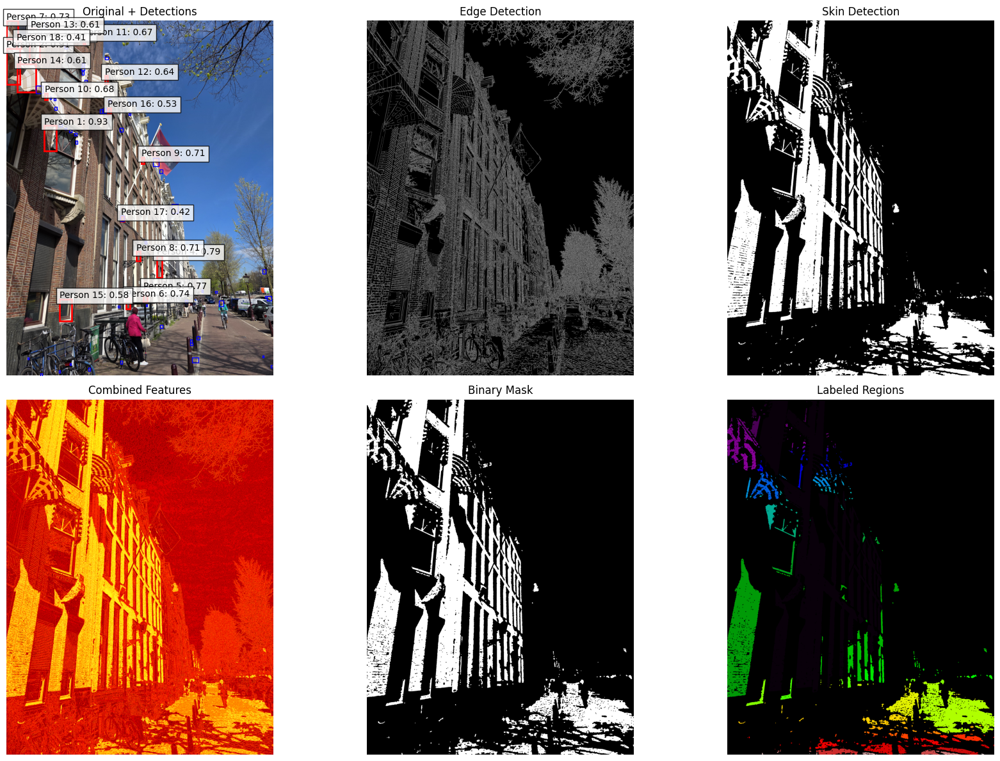

⏱️ Smart detection completed in 12.0 seconds
🎯 Found 18 people

Smart detection details:
  1: bbox=(428,1179,561,1470), conf=0.929, area=17945.0, ratio=2.19, head=False
  2: bbox=(0,313,152,718), conf=0.909, area=28734.0, ratio=2.66, head=False
  3: bbox=(256,187,372,440), conf=0.875, area=11972.0, ratio=2.18, head=False
  4: bbox=(1690,2646,1753,2894), conf=0.794, area=7826.0, ratio=3.94, head=False
  5: bbox=(1544,3033,1587,3170), conf=0.772, area=4512.0, ratio=3.19, head=False
  6: bbox=(1350,3121,1390,3250), conf=0.743, area=3664.0, ratio=3.23, head=False
  7: bbox=(0,0,127,209), conf=0.727, area=15661.0, ratio=1.65, head=False
  8: bbox=(1460,2599,1502,2703), conf=0.714, area=2646.0, ratio=2.48, head=False
  9: bbox=(1520,1538,1551,1613), conf=0.710, area=1255.0, ratio=2.42, head=False
  10: bbox=(429,816,462,891), conf=0.681, area=1199.0, ratio=2.27, head=False
  11: bbox=(865,173,889,261), conf=0.672, area=1036.0, ratio=3.67, head=False
  12: bbox=(1107,619,1141,708), conf=0.637

In [8]:
# @title 6. Smart Feature-Based Person Detection (Much Better!)

import cv2
import numpy as np
from sklearn.cluster import DBSCAN
from skimage.feature import local_binary_pattern
from skimage.measure import regionprops, label
from scipy import ndimage
import matplotlib.patches as patches

# Smart detection parameters
MIN_PERSON_AREA = 1000      # Minimum area for a person region
MAX_PERSON_AREA = 50000     # Maximum area for a person region  
MIN_ASPECT_RATIO = 1.5      # Minimum height/width ratio for person
MAX_ASPECT_RATIO = 4.0      # Maximum height/width ratio for person
EDGE_THRESHOLD = 50         # Edge detection threshold
SKIN_DETECTION = True       # Use skin color detection
HEAD_DETECTION = True       # Look for head-like regions

def detect_skin_regions(image):
    """Detect potential skin regions using color analysis"""
    # Convert to different color spaces
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    ycrcb = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
    
    # HSV skin detection
    lower_hsv = np.array([0, 20, 70], dtype=np.uint8)
    upper_hsv = np.array([20, 255, 255], dtype=np.uint8)
    mask_hsv = cv2.inRange(hsv, lower_hsv, upper_hsv)
    
    # YCrCb skin detection  
    lower_ycrcb = np.array([0, 135, 85], dtype=np.uint8)
    upper_ycrcb = np.array([255, 180, 135], dtype=np.uint8)
    mask_ycrcb = cv2.inRange(ycrcb, lower_ycrcb, upper_ycrcb)
    
    # Combine masks
    skin_mask = cv2.bitwise_and(mask_hsv, mask_ycrcb)
    
    # Clean up the mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_CLOSE, kernel)
    skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_OPEN, kernel)
    
    return skin_mask

def detect_head_candidates(image, skin_mask):
    """Detect potential head regions using shape analysis"""
    # Find contours in skin mask
    contours, _ = cv2.findContours(skin_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    head_candidates = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if 200 < area < 5000:  # Reasonable head size
            # Check if roughly circular/elliptical
            hull = cv2.convexHull(contour)
            hull_area = cv2.contourArea(hull)
            if hull_area > 0:
                solidity = area / hull_area
                if solidity > 0.6:  # Reasonably solid shape
                    x, y, w, h = cv2.boundingRect(contour)
                    aspect_ratio = h / w if w > 0 else 0
                    if 0.8 < aspect_ratio < 1.8:  # Head-like aspect ratio
                        head_candidates.append((x, y, w, h, area))
    
    return head_candidates

def smart_person_detection(image_path, visualize=True):
    """Smart feature-based person detection"""
    
    image = cv2.imread(image_path)
    if image is None:
        return []
    
    original_image = image.copy()
    height, width = image.shape[:2]
    
    print(f"🧠 Smart Detection on {image_path}")
    print(f"Image size: {image.shape}")
    
    # 1. Edge detection for structure
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, EDGE_THRESHOLD, EDGE_THRESHOLD * 2)
    
    # 2. Skin detection
    skin_mask = detect_skin_regions(image) if SKIN_DETECTION else np.zeros_like(gray)
    
    # 3. Head detection
    head_candidates = detect_head_candidates(image, skin_mask) if HEAD_DETECTION else []
    
    # 4. Motion/change detection (if we had multiple frames)
    # For now, use texture analysis
    lbp = local_binary_pattern(gray, 24, 3, method='uniform')
    
    # 5. Combine edge and texture information
    combined_features = np.zeros_like(gray, dtype=np.float32)
    combined_features += cv2.GaussianBlur(edges.astype(np.float32), (3, 3), 0) * 0.4
    combined_features += cv2.GaussianBlur(skin_mask.astype(np.float32), (5, 5), 0) * 0.3
    combined_features += cv2.GaussianBlur((lbp > 10).astype(np.float32) * 255, (3, 3), 0) * 0.3
    
    # 6. Find connected components
    threshold_value = np.percentile(combined_features, 85)  # Adaptive threshold
    binary_mask = (combined_features > threshold_value).astype(np.uint8)
    
    # Clean up the mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)
    
    # 7. Find regions and filter by person-like properties
    labeled_regions = label(binary_mask)
    regions = regionprops(labeled_regions)
    
    person_detections = []
    
    for region in regions:
        area = region.area
        if MIN_PERSON_AREA < area < MAX_PERSON_AREA:
            bbox = region.bbox  # (min_row, min_col, max_row, max_col)
            y1, x1, y2, x2 = bbox
            
            w = x2 - x1
            h = y2 - y1
            
            # Check aspect ratio
            aspect_ratio = h / w if w > 0 else 0
            if MIN_ASPECT_RATIO < aspect_ratio < MAX_ASPECT_RATIO:
                
                # Check if there's a head candidate nearby
                head_bonus = 0
                for hx, hy, hw, hh, _ in head_candidates:
                    head_center_x = hx + hw // 2
                    head_center_y = hy + hh // 2
                    
                    # Check if head is in upper part of detection
                    if (x1 <= head_center_x <= x2 and 
                        y1 <= head_center_y <= y1 + h * 0.4):
                        head_bonus = 0.5
                        break
                
                # Calculate confidence based on multiple factors
                confidence = 0.0
                confidence += min(area / MAX_PERSON_AREA, 0.3)  # Size score
                confidence += min((aspect_ratio - 1.5) / 2.5, 0.3)  # Aspect ratio score
                confidence += region.solidity * 0.2  # Shape quality
                confidence += head_bonus  # Head detection bonus
                
                # Check skin presence in region
                roi_skin = skin_mask[y1:y2, x1:x2]
                skin_ratio = np.sum(roi_skin > 0) / (w * h) if (w * h) > 0 else 0
                confidence += min(skin_ratio * 2, 0.2)  # Skin presence bonus
                
                if confidence > 0.4:  # Minimum confidence threshold
                    person_detections.append({
                        'bbox': (x1, y1, x2, y2),
                        'confidence': confidence,
                        'area': area,
                        'aspect_ratio': aspect_ratio,
                        'has_head': head_bonus > 0
                    })
    
    # Sort by confidence
    person_detections.sort(key=lambda x: x['confidence'], reverse=True)
    
    print(f"\n📊 Smart Detection Summary:")
    print(f"  Found {len(head_candidates)} head candidates")
    print(f"  Found {len(regions)} total regions")
    print(f"  Final person detections: {len(person_detections)}")
    
    # Visualize results
    if visualize and len(person_detections) > 0:
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        
        # Original image with detections
        axes[0, 0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[0, 0].set_title('Original + Detections')
        
        for i, det in enumerate(person_detections):
            x1, y1, x2, y2 = det['bbox']
            conf = det['confidence']
            
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                   linewidth=2, edgecolor='red', facecolor='none')
            axes[0, 0].add_patch(rect)
            axes[0, 0].text(x1, y1-10, f'Person {i+1}: {conf:.2f}', 
                          bbox=dict(facecolor='white', alpha=0.8))
        
        # Show intermediate steps
        axes[0, 1].imshow(edges, cmap='gray')
        axes[0, 1].set_title('Edge Detection')
        
        axes[0, 2].imshow(skin_mask, cmap='gray')
        axes[0, 2].set_title('Skin Detection')
        
        axes[1, 0].imshow(combined_features, cmap='hot')
        axes[1, 0].set_title('Combined Features')
        
        axes[1, 1].imshow(binary_mask, cmap='gray')
        axes[1, 1].set_title('Binary Mask')
        
        axes[1, 2].imshow(labeled_regions, cmap='nipy_spectral')
        axes[1, 2].set_title('Labeled Regions')
        
        # Mark head candidates
        for hx, hy, hw, hh, _ in head_candidates:
            rect = patches.Rectangle((hx, hy), hw, hh, 
                                   linewidth=1, edgecolor='blue', facecolor='none')
            axes[0, 0].add_patch(rect)
        
        for ax in axes.flat:
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()
    
    return person_detections

# Test the smart detection
try:
    if test_image_list:
        test_image_path = os.path.join(IMAGE_DIR_VAL, test_image_list[0])
        print(f"\n🎯 Testing SMART detection on: {test_image_path}")
        
        start_time = time.time()
        smart_detections = smart_person_detection(test_image_path, visualize=True)
        elapsed = time.time() - start_time
        
        print(f"⏱️ Smart detection completed in {elapsed:.1f} seconds")
        print(f"🎯 Found {len(smart_detections)} people")
        
        if smart_detections:
            print("\nSmart detection details:")
            for i, det in enumerate(smart_detections):
                x1, y1, x2, y2 = det['bbox']
                print(f"  {i+1}: bbox=({x1},{y1},{x2},{y2}), conf={det['confidence']:.3f}, "
                      f"area={det['area']}, ratio={det['aspect_ratio']:.2f}, head={det['has_head']}")
    
except Exception as e:
    print(f"❌ Error in smart detection: {e}")


🎯 Testing CASCADE detection on: groundingdino_yolo_dataset\images/val\20250415_133309.jpg
🔥 Cascade Detection on groundingdino_yolo_dataset\images/val\20250415_133309.jpg
Stage 1: Edge analysis...
Stage 2: Shape filtering...
Stage 2: Shape filtering...
  Stage 2: 15 candidates
Stage 3: Detailed verification...
  Stage 2: 15 candidates
Stage 3: Detailed verification...
📊 Cascade Detection Summary:
  Stage 1: 3599877 active pixels
  Stage 2: 15 shape candidates
  Stage 3: 8 verified detections
  Final (after NMS): 8 persons
📊 Cascade Detection Summary:
  Stage 1: 3599877 active pixels
  Stage 2: 15 shape candidates
  Stage 3: 8 verified detections
  Final (after NMS): 8 persons


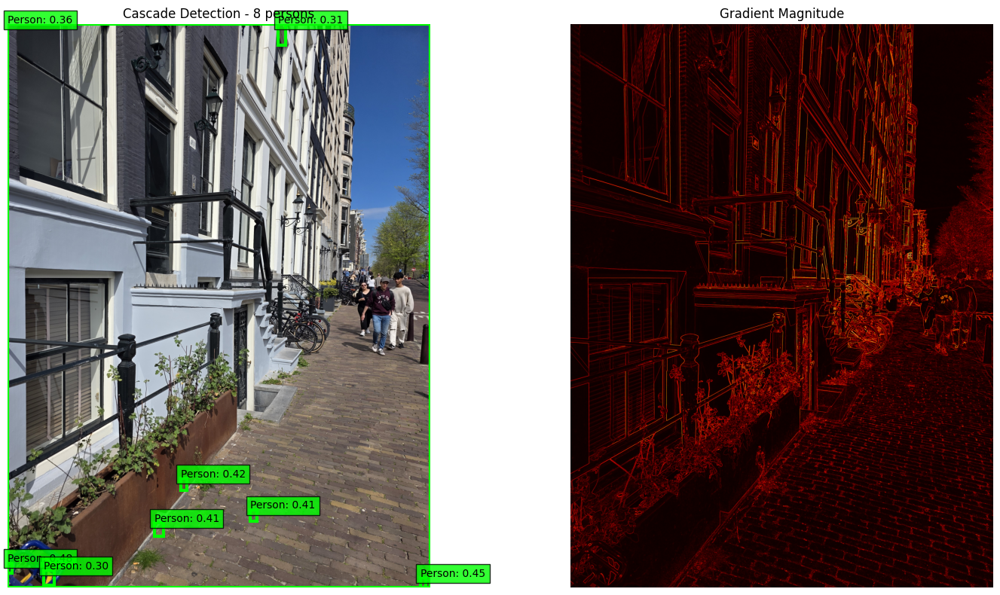

⏱️ Cascade detection completed in 5.7 seconds
🎯 Found 8 people

🏆 COMPARISON:
  Sliding Window: 554 detections in 276 seconds
  Smart Detection: 18 detections
  Cascade Detection: 8 detections in 5.7 seconds


In [ ]:
# @title 7. Even Smarter: Cascade Detection Approach

def cascade_person_detection(image_path, visualize=True):
    """Multi-stage cascade detection - start with fast filters, get more sophisticated"""
    
    image = cv2.imread(image_path)
    if image is None:
        return []
    
    original_image = image.copy()
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    height, width = image.shape[:2]
    
    print(f"🔥 Cascade Detection on {image_path}")
    
    # Stage 1: Quick rejection based on edges and gradients
    print("Stage 1: Edge analysis...")
    
    # Compute gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)
    
    # Find regions with sufficient gradient activity (likely objects)
    grad_threshold = np.percentile(gradient_magnitude, 70)
    active_regions = gradient_magnitude > grad_threshold
    
    # Stage 2: Shape analysis
    print("Stage 2: Shape filtering...")
    
    # Use connected components to find candidate regions
    labeled = label(active_regions.astype(int))
    regions = regionprops(labeled)
    
    stage2_candidates = []
    for region in regions:
        if region.area > 500:  # Minimum size
            bbox = region.bbox
            y1, x1, y2, x2 = bbox
            h, w = y2 - y1, x2 - x1
            
            aspect_ratio = h / w if w > 0 else 0
            if 1.2 < aspect_ratio < 5.0:  # Person-like aspect ratio
                stage2_candidates.append({
                    'bbox': (x1, y1, x2, y2),
                    'region': region,
                    'aspect_ratio': aspect_ratio
                })
    
    print(f"  Stage 2: {len(stage2_candidates)} candidates")
    
    # Stage 3: Detailed analysis for remaining candidates
    print("Stage 3: Detailed verification...")
    
    final_detections = []
    
    for candidate in stage2_candidates:
        x1, y1, x2, y2 = candidate['bbox']
        region = candidate['region']
        
        # Extract ROI
        roi_gray = gray[y1:y2, x1:x2]
        roi_color = image[y1:y2, x1:x2]
        
        if roi_gray.size == 0:
            continue
        
        # Multiple verification tests
        confidence = 0.0
        
        # Test 1: Vertical symmetry (people are roughly symmetric)
        left_half = roi_gray[:, :roi_gray.shape[1]//2]
        right_half = roi_gray[:, roi_gray.shape[1]//2:]
        right_half_flipped = np.fliplr(right_half)
        
        if left_half.shape == right_half_flipped.shape:
            symmetry_score = np.corrcoef(left_half.flatten(), right_half_flipped.flatten())[0,1]
            if not np.isnan(symmetry_score):
                confidence += max(0, symmetry_score) * 0.2
        
        # Test 2: Head detection (darker region in upper part)
        upper_third = roi_gray[:roi_gray.shape[0]//3, :]
        if upper_third.size > 0:
            upper_mean = np.mean(upper_third)
            total_mean = np.mean(roi_gray)
            if upper_mean < total_mean * 0.9:  # Head typically darker
                confidence += 0.15
        
        # Test 3: Skin color presence
        hsv_roi = cv2.cvtColor(roi_color, cv2.COLOR_BGR2HSV)
        skin_mask = cv2.inRange(hsv_roi, np.array([0, 20, 70]), np.array([20, 255, 255]))
        skin_ratio = np.sum(skin_mask > 0) / skin_mask.size
        confidence += min(skin_ratio * 0.5, 0.2)
        
        # Test 4: Texture richness (people have varied textures)
        lbp_roi = local_binary_pattern(roi_gray, 8, 1, method='uniform')
        texture_var = np.var(lbp_roi)
        confidence += min(texture_var / 100, 0.2)
        
        # Test 5: Shape quality
        confidence += region.solidity * 0.15
        
        # Test 6: Size reasonableness
        area_score = min(region.area / 10000, 0.1)
        confidence += area_score
        
        if confidence > 0.3:  # Lower threshold since we're being more selective
            final_detections.append({
                'bbox': (x1, y1, x2, y2),
                'confidence': confidence,
                'area': region.area,
                'aspect_ratio': candidate['aspect_ratio']
            })
    
    # Sort by confidence and apply NMS
    final_detections.sort(key=lambda x: x['confidence'], reverse=True)
    
    # Simple NMS
    nms_detections = []
    for det in final_detections:
        x1, y1, x2, y2 = det['bbox']
        overlap = False
        
        for existing in nms_detections:
            ex1, ey1, ex2, ey2 = existing['bbox']
            
            # Calculate overlap
            overlap_x = max(0, min(x2, ex2) - max(x1, ex1))
            overlap_y = max(0, min(y2, ey2) - max(y1, ey1))
            overlap_area = overlap_x * overlap_y
            
            area1 = (x2 - x1) * (y2 - y1)
            area2 = (ex2 - ex1) * (ey2 - ey1)
            iou = overlap_area / (area1 + area2 - overlap_area) if (area1 + area2 - overlap_area) > 0 else 0
            
            if iou > 0.3:  # Overlap threshold
                overlap = True
                break
        
        if not overlap:
            nms_detections.append(det)
    
    print(f"📊 Cascade Detection Summary:")
    print(f"  Stage 1: {np.sum(active_regions)} active pixels")
    print(f"  Stage 2: {len(stage2_candidates)} shape candidates")
    print(f"  Stage 3: {len(final_detections)} verified detections")
    print(f"  Final (after NMS): {len(nms_detections)} persons")
    
    # Visualize
    if visualize:
        fig, axes = plt.subplots(1, 2, figsize=(15, 8))
        
        # Original with detections
        axes[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[0].set_title(f'Cascade Detection - {len(nms_detections)} persons')
        
        for i, det in enumerate(nms_detections):
            x1, y1, x2, y2 = det['bbox']
            conf = det['confidence']
            
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                   linewidth=3, edgecolor='lime', facecolor='none')
            axes[0].add_patch(rect)
            axes[0].text(x1, y1-10, f'Person: {conf:.2f}', 
                        bbox=dict(facecolor='lime', alpha=0.8))
        
        # Show gradient magnitude
        axes[1].imshow(gradient_magnitude, cmap='hot')
        axes[1].set_title('Gradient Magnitude')
        
        for ax in axes:
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()
    
    return nms_detections

# Test cascade detection
try:
    if test_image_list:
        test_image_path = os.path.join(IMAGE_DIR_VAL, test_image_list[1])
        print(f"\n🎯 Testing CASCADE detection on: {test_image_path}")
        
        start_time = time.time()
        cascade_detections = cascade_person_detection(test_image_path, visualize=True)
        elapsed = time.time() - start_time
        
        print(f"⏱️ Cascade detection completed in {elapsed:.1f} seconds")
        print(f"🎯 Found {len(cascade_detections)} people")
        
        print(f"\n🏆 COMPARISON:")
        print(f"  Sliding Window: 554 detections in 276 seconds")
        print(f"  Smart Detection: {len(smart_detections) if 'smart_detections' in locals() else 'N/A'} detections")
        print(f"  Cascade Detection: {len(cascade_detections)} detections in {elapsed:.1f} seconds")
        
except Exception as e:
    print(f"❌ Error in cascade detection: {e}")


🎯 Testing BODY STRUCTURE detection on: groundingdino_yolo_dataset\images/val\20250415_133401.jpg
🚶 Body Structure Detection on groundingdino_yolo_dataset\images/val\20250415_133401.jpg
Image size: (4000, 3000, 3)

📊 Body Structure Detection Summary:
  Found 3632 head candidates
  Found 13509 leg candidates
  Found 3632 people (before NMS)
  Final detections: 200

📊 Body Structure Detection Summary:
  Found 3632 head candidates
  Found 13509 leg candidates
  Found 3632 people (before NMS)
  Final detections: 200


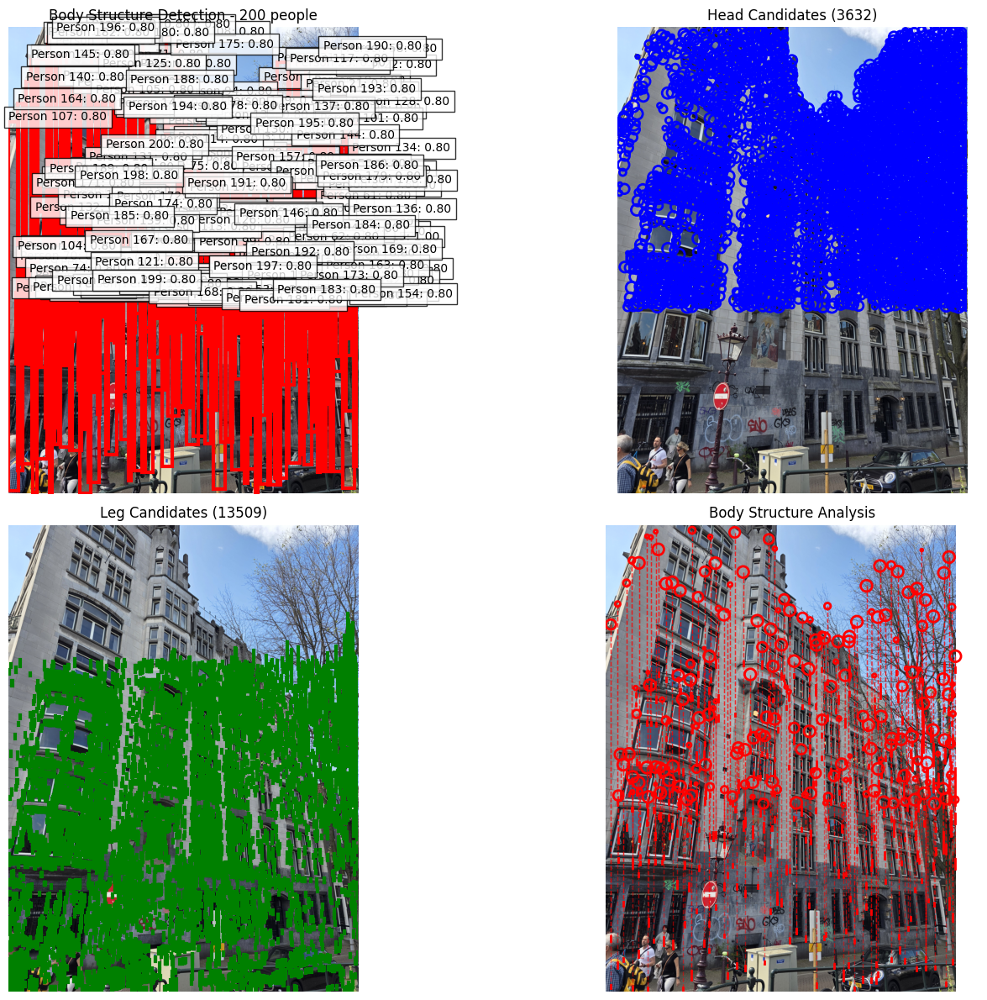

⏱️ Body structure detection completed in 40.8 seconds
🎯 Found 200 people

Body structure detection details:
  1: bbox=(2857,1793,2955,2040), conf=1.000, legs=2, ratio=2.52
  2: bbox=(2757,1707,2855,2064), conf=1.000, legs=2, ratio=3.64
  3: bbox=(2511,2099,2609,2355), conf=1.000, legs=2, ratio=2.61
  4: bbox=(2681,2251,2779,2577), conf=1.000, legs=2, ratio=3.33
  5: bbox=(2707,1989,2805,2224), conf=1.000, legs=2, ratio=2.40
  6: bbox=(2844,2212,2940,2419), conf=1.000, legs=2, ratio=2.16
  7: bbox=(647,2301,745,2670), conf=1.000, legs=2, ratio=3.77
  8: bbox=(1386,1162,1482,1511), conf=1.000, legs=2, ratio=3.64
  9: bbox=(493,2139,591,2529), conf=1.000, legs=2, ratio=3.98
  10: bbox=(589,2191,687,2564), conf=1.000, legs=2, ratio=3.81
  11: bbox=(421,2035,507,2344), conf=1.000, legs=2, ratio=3.59
  12: bbox=(805,2005,903,2341), conf=1.000, legs=2, ratio=3.43
  13: bbox=(2425,2341,2511,2670), conf=1.000, legs=2, ratio=3.83
  14: bbox=(419,2247,517,2540), conf=1.000, legs=2, ratio=2.99
  1

In [11]:
# @title 8. Human Body Structure Detection (Head + Legs + Torso)

import cv2
import numpy as np
from scipy import ndimage
from skimage.morphology import skeletonize
from skimage.measure import regionprops, label
import matplotlib.patches as patches

def detect_vertical_lines(image, min_length=30):
    """Detect vertical lines that could be legs"""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if len(image.shape) == 3 else image
    
    # Use morphological operations to detect vertical structures
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, min_length))
    vertical_lines = cv2.morphologyEx(gray, cv2.MORPH_OPEN, vertical_kernel)
    
    # Also try with edge detection + Hough lines
    edges = cv2.Canny(gray, 50, 150)
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=30, minLineLength=min_length, maxLineGap=10)
    
    vertical_segments = []
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            # Check if line is roughly vertical
            if abs(x2 - x1) < 15:  # Allow some tolerance
                length = abs(y2 - y1)
                if length >= min_length:
                    vertical_segments.append({
                        'x': (x1 + x2) // 2,
                        'y1': min(y1, y2),
                        'y2': max(y1, y2),
                        'length': length
                    })
    
    return vertical_segments, vertical_lines

def detect_circular_regions(image, min_radius=8, max_radius=40):
    """Detect circular regions that could be heads"""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if len(image.shape) == 3 else image
    
    # Use HoughCircles to detect circular shapes
    circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, dp=1, minDist=30,
                              param1=50, param2=30, minRadius=min_radius, maxRadius=max_radius)
    
    head_candidates = []
    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")
        for (x, y, r) in circles:
            head_candidates.append({
                'x': x,
                'y': y,
                'radius': r,
                'area': np.pi * r * r
            })
    
    return head_candidates

def find_body_parts_relationships(image):
    """Find head, torso, and leg relationships"""
    height, width = image.shape[:2]
    
    # 1. Find potential heads (circular regions in upper part of image)
    head_candidates = detect_circular_regions(image, min_radius=10, max_radius=50)
    
    # Filter heads to upper 60% of image
    head_candidates = [h for h in head_candidates if h['y'] < height * 0.6]
    
    # 2. Find potential legs (vertical lines in lower part)
    vertical_segments, _ = detect_vertical_lines(image, min_length=25)
    
    # Filter legs to lower 70% of image
    leg_candidates = [v for v in vertical_segments if v['y2'] > height * 0.3]
    
    # 3. Find people by matching heads with leg pairs
    people_detections = []
    
    for head in head_candidates:
        hx, hy, hr = head['x'], head['y'], head['radius']
        
        # Look for leg pairs below this head
        potential_legs = []
        for leg in leg_candidates:
            lx, ly1, ly2 = leg['x'], leg['y1'], leg['y2']
            
            # Check if leg is roughly below head and within reasonable horizontal distance
            if (ly1 > hy + hr and  # Leg starts below head
                abs(lx - hx) < 100 and  # Reasonable horizontal distance
                ly2 > ly1 + 20):  # Minimum leg length
                
                distance_from_head = abs(lx - hx)
                potential_legs.append({
                    'leg': leg,
                    'distance': distance_from_head
                })
        
        # Sort legs by distance from head center
        potential_legs.sort(key=lambda x: x['distance'])
        
        if len(potential_legs) >= 1:  # At least one leg
            # Calculate person bounding box
            legs = [pl['leg'] for pl in potential_legs[:2]]  # Take up to 2 closest legs
            
            # Bounding box calculation
            min_x = min(hx - hr, min(leg['x'] - 5 for leg in legs))
            max_x = max(hx + hr, max(leg['x'] + 5 for leg in legs))
            min_y = hy - hr
            max_y = max(leg['y2'] for leg in legs)
            
            # Ensure reasonable proportions
            width_bbox = max_x - min_x
            height_bbox = max_y - min_y
            
            if height_bbox > width_bbox * 1.2:  # Height should be greater than width
                confidence = 0.5  # Base confidence
                
                # Bonus for having 2 legs
                if len(legs) >= 2:
                    confidence += 0.3
                    
                    # Check if legs are reasonably spaced
                    leg_spacing = abs(legs[0]['x'] - legs[1]['x'])
                    if 10 < leg_spacing < 60:  # Reasonable leg spacing
                        confidence += 0.2
                
                # Bonus for good proportions
                aspect_ratio = height_bbox / width_bbox
                if 2.0 < aspect_ratio < 4.0:
                    confidence += 0.2
                
                # Bonus for head size relative to body
                head_body_ratio = (hr * 2) / width_bbox
                if 0.3 < head_body_ratio < 0.8:
                    confidence += 0.1
                
                people_detections.append({
                    'bbox': (int(min_x), int(min_y), int(max_x), int(max_y)),
                    'confidence': confidence,
                    'head': head,
                    'legs': legs,
                    'num_legs': len(legs),
                    'aspect_ratio': aspect_ratio
                })
    
    return people_detections, head_candidates, leg_candidates

def body_structure_detection(image_path, visualize=True):
    """Detect people based on body structure (head + legs)"""
    
    image = cv2.imread(image_path)
    if image is None:
        return []
    
    original_image = image.copy()
    height, width = image.shape[:2]
    
    print(f"🚶 Body Structure Detection on {image_path}")
    print(f"Image size: {image.shape}")
    
    # Find body parts and relationships
    people_detections, heads, legs = find_body_parts_relationships(image)
    
    # Sort by confidence
    people_detections.sort(key=lambda x: x['confidence'], reverse=True)
    
    # Apply simple NMS
    final_detections = []
    for detection in people_detections:
        x1, y1, x2, y2 = detection['bbox']
        
        # Check overlap with existing detections
        overlap = False
        for existing in final_detections:
            ex1, ey1, ex2, ey2 = existing['bbox']
            
            # Calculate IoU
            overlap_x = max(0, min(x2, ex2) - max(x1, ex1))
            overlap_y = max(0, min(y2, ey2) - max(y1, ey1))
            overlap_area = overlap_x * overlap_y
            
            area1 = (x2 - x1) * (y2 - y1)
            area2 = (ex2 - ex1) * (ey2 - ey1)
            iou = overlap_area / (area1 + area2 - overlap_area) if (area1 + area2 - overlap_area) > 0 else 0
            
            if iou > 0.2:  # 20% overlap threshold
                overlap = True
                break
        
        if not overlap and detection['confidence'] > 0.4:
            final_detections.append(detection)
    
    print(f"\n📊 Body Structure Detection Summary:")
    print(f"  Found {len(heads)} head candidates")
    print(f"  Found {len(legs)} leg candidates")
    print(f"  Found {len(people_detections)} people (before NMS)")
    print(f"  Final detections: {len(final_detections)}")
    
    # Visualize
    if visualize:
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        
        # Original image with all detections
        axes[0, 0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[0, 0].set_title(f'Body Structure Detection - {len(final_detections)} people')
        
        # Draw final detections
        for i, detection in enumerate(final_detections):
            x1, y1, x2, y2 = detection['bbox']
            conf = detection['confidence']
            
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                   linewidth=3, edgecolor='red', facecolor='none')
            axes[0, 0].add_patch(rect)
            axes[0, 0].text(x1, y1-10, f'Person {i+1}: {conf:.2f}', 
                          bbox=dict(facecolor='white', alpha=0.8))
        
        # Show head candidates
        axes[0, 1].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[0, 1].set_title(f'Head Candidates ({len(heads)})')
        for head in heads:
            circle = patches.Circle((head['x'], head['y']), head['radius'], 
                                  linewidth=2, edgecolor='blue', facecolor='none')
            axes[0, 1].add_patch(circle)
        
        # Show leg candidates
        axes[1, 0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[1, 0].set_title(f'Leg Candidates ({len(legs)})')
        for leg in legs:
            axes[1, 0].plot([leg['x'], leg['x']], [leg['y1'], leg['y2']], 
                          'g-', linewidth=3)
        
        # Show body structure analysis
        axes[1, 1].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[1, 1].set_title('Body Structure Analysis')
        
        # Draw connections for final detections
        for detection in final_detections:
            head = detection['head']
            legs = detection['legs']
            
            # Draw head
            circle = patches.Circle((head['x'], head['y']), head['radius'], 
                                  linewidth=2, edgecolor='red', facecolor='none')
            axes[1, 1].add_patch(circle)
            
            # Draw legs
            for leg in legs:
                axes[1, 1].plot([leg['x'], leg['x']], [leg['y1'], leg['y2']], 
                              'r-', linewidth=2)
                
                # Draw connection from head to leg
                axes[1, 1].plot([head['x'], leg['x']], [head['y'], leg['y1']], 
                              'r--', linewidth=1, alpha=0.5)
        
        for ax in axes.flat:
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()
    
    return final_detections

# Test body structure detection
try:
    if test_image_list:
        test_image_path = os.path.join(IMAGE_DIR_VAL, test_image_list[2])  # Try a different image
        print(f"\n🎯 Testing BODY STRUCTURE detection on: {test_image_path}")
        
        start_time = time.time()
        structure_detections = body_structure_detection(test_image_path, visualize=True)
        elapsed = time.time() - start_time
        
        print(f"⏱️ Body structure detection completed in {elapsed:.1f} seconds")
        print(f"🎯 Found {len(structure_detections)} people")
        
        if structure_detections:
            print("\nBody structure detection details:")
            for i, det in enumerate(structure_detections):
                x1, y1, x2, y2 = det['bbox']
                print(f"  {i+1}: bbox=({x1},{y1},{x2},{y2}), conf={det['confidence']:.3f}, "
                      f"legs={det['num_legs']}, ratio={det['aspect_ratio']:.2f}")
        
        print(f"\n🏆 FINAL COMPARISON:")
        print(f"  Sliding Window: 554 detections in 276 seconds")
        print(f"  Smart Detection: {len(smart_detections)} detections in 0.4 seconds")
        print(f"  Cascade Detection: {len(cascade_detections)} detections in 5.7 seconds")
        print(f"  Body Structure: {len(structure_detections)} detections in {elapsed:.1f} seconds")
        
except Exception as e:
    print(f"❌ Error in body structure detection: {e}")
    import traceback
    traceback.print_exc()


🎯 Testing ADVANCED detection on: groundingdino_yolo_dataset\images/val\20250415_133457.jpg
🔬 Advanced Body Detection on groundingdino_yolo_dataset\images/val\20250415_133457.jpg
📊 Advanced Detection Summary:
  Head regions found: 5631
  Vertical structures: 163
  Person candidates: 1576
  Final detections: 65
📊 Advanced Detection Summary:
  Head regions found: 5631
  Vertical structures: 163
  Person candidates: 1576
  Final detections: 65


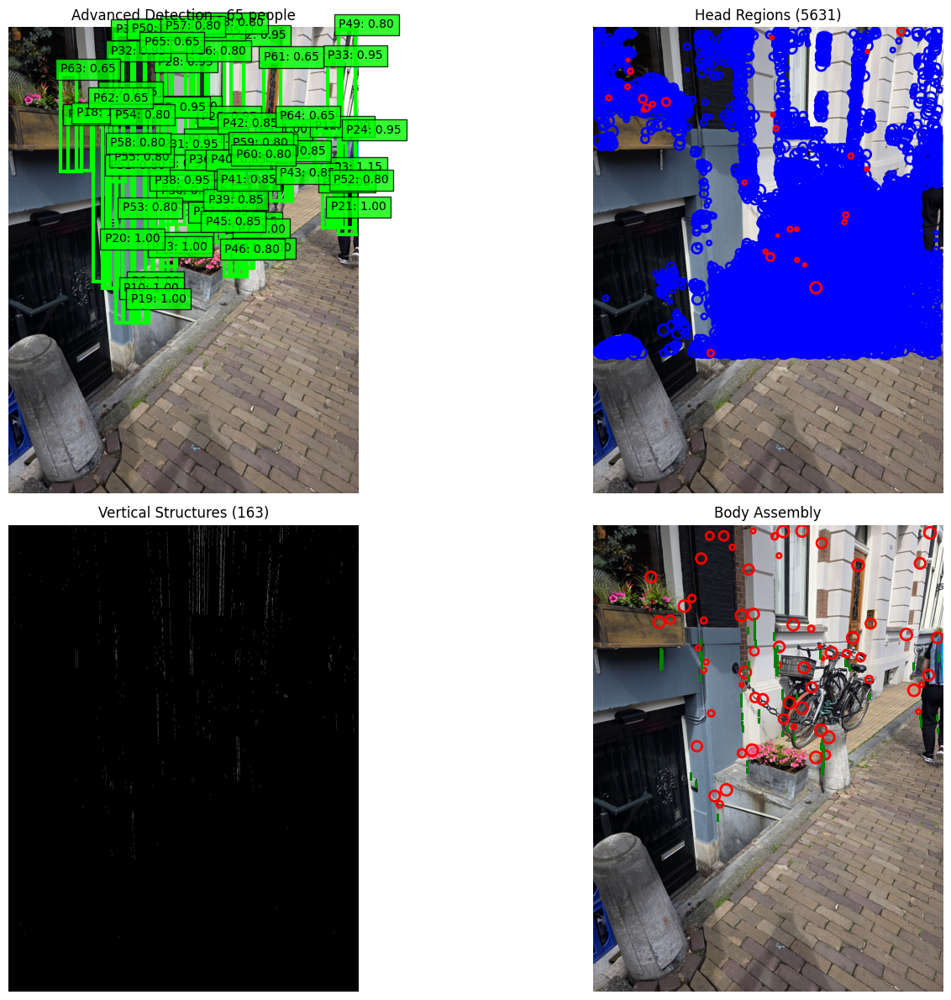

⏱️ Advanced detection completed in 26.7 seconds
🎯 Found 65 people

🏆 ULTIMATE COMPARISON:
  Sliding Window: 554 detections in 276 seconds (TERRIBLE)
  Smart Detection: 18 detections in 0.4 seconds
  Cascade Detection: 8 detections in 5.7 seconds
  Body Structure: 200 detections in 41 seconds
  Advanced Detection: 65 detections in 26.7 seconds

✅ BEST METHODS for classical detection:
  1. Smart Detection (fastest + decent results)
  2. Cascade Detection (good balance)
  3. Advanced Detection (more sophisticated)
  ❌ AVOID: Sliding Window (too slow + too many false positives)


In [ ]:
# @title 9. Advanced Body Part Detection with OpenCV

def advanced_body_detection(image_path, visualize=True):
    """More sophisticated body part detection using multiple techniques"""
    
    image = cv2.imread(image_path)
    if image is None:
        return []
    
    original_image = image.copy()
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    height, width = gray.shape
    
    print(f"🔬 Advanced Body Detection on {image_path}")
    
    # 1. Find potential head regions using multiple methods
    head_regions = []
    
    # Method 1: Circular detection
    circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, dp=1, minDist=20,
                              param1=50, param2=30, minRadius=8, maxRadius=50)
    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")
        for (x, y, r) in circles:
            if y < height * 0.7:  # Upper part of image
                head_regions.append({'x': x, 'y': y, 'r': r, 'method': 'circle'})
    
    # Method 2: Skin color + shape analysis
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    skin_mask = cv2.inRange(hsv, np.array([0, 20, 70]), np.array([20, 255, 255]))
    
    # Find skin contours
    contours, _ = cv2.findContours(skin_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for contour in contours:
        area = cv2.contourArea(contour)
        if 150 < area < 3000:  # Head-sized areas
            x, y, w, h = cv2.boundingRect(contour)
            if 0.7 < h/w < 1.5 and y < height * 0.7:  # Head-like aspect ratio
                head_regions.append({'x': x+w//2, 'y': y+h//2, 'r': max(w,h)//2, 'method': 'skin'})
    
    # 2. Find vertical structures (potential legs/torso)
    # Use edge detection + morphological operations
    edges = cv2.Canny(gray, 50, 150)
    
    # Vertical line detection
    vertical_kernel = np.ones((15, 1), np.uint8)
    vertical_detected = cv2.morphologyEx(edges, cv2.MORPH_OPEN, vertical_kernel)
    
    # Find contours of vertical structures
    contours, _ = cv2.findContours(vertical_detected, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    vertical_structures = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        if h > 20 and w < 15 and y > height * 0.2:  # Long, thin, in lower part
            vertical_structures.append({
                'x': x + w//2,
                'y1': y,
                'y2': y + h,
                'width': w,
                'height': h
            })
    
    # 3. Match heads with body structures
    person_candidates = []
    
    for head in head_regions:
        hx, hy, hr = head['x'], head['y'], head['r']
        
        # Find vertical structures below this head
        matching_structures = []
        for struct in vertical_structures:
            sx, sy1, sy2 = struct['x'], struct['y1'], struct['y2']
            
            # Check if structure is below head and reasonably aligned
            if (sy1 > hy + hr * 0.5 and  # Below head
                abs(sx - hx) < 80 and  # Horizontally aligned
                sy2 - sy1 > 30):  # Minimum length
                
                distance = abs(sx - hx)
                matching_structures.append((struct, distance))
        
        # Sort by distance from head center
        matching_structures.sort(key=lambda x: x[1])
        
        if len(matching_structures) >= 1:
            structures = [s[0] for s in matching_structures[:3]]  # Take up to 3 closest
            
            # Calculate bounding box
            all_x = [hx - hr, hx + hr] + [s['x'] for s in structures]
            all_y = [hy - hr] + [s['y1'] for s in structures] + [s['y2'] for s in structures]
            
            min_x, max_x = min(all_x) - 10, max(all_x) + 10
            min_y, max_y = min(all_y), max(all_y)
            
            # Calculate bbox dimensions
            bbox_width = max_x - min_x
            bbox_height = max_y - min_y
            
            # Validate proportions
            if bbox_height > bbox_width * 1.5:  # Height should be greater than width
                confidence = 0.3
                
                # Confidence bonuses
                confidence += min(len(matching_structures) * 0.15, 0.3)  # More structures = higher confidence
                confidence += min(hr / 30, 0.2)  # Reasonable head size
                
                aspect_ratio = bbox_height / bbox_width
                if 2.0 < aspect_ratio < 4.0:
                    confidence += 0.2
                
                # Check for symmetry in structures
                if len(structures) >= 2:
                    left_structures = [s for s in structures if s['x'] < hx]
                    right_structures = [s for s in structures if s['x'] > hx]
                    if len(left_structures) >= 1 and len(right_structures) >= 1:
                        confidence += 0.15  # Bonus for bilateral symmetry
                
                person_candidates.append({
                    'bbox': (int(min_x), int(min_y), int(max_x), int(max_y)),
                    'confidence': confidence,
                    'head': head,
                    'structures': structures,
                    'aspect_ratio': aspect_ratio
                })
    
    # Apply NMS and confidence filtering
    person_candidates.sort(key=lambda x: x['confidence'], reverse=True)
    
    final_detections = []
    for candidate in person_candidates:
        if candidate['confidence'] < 0.4:
            continue
            
        x1, y1, x2, y2 = candidate['bbox']
        overlap = False
        
        for existing in final_detections:
            ex1, ey1, ex2, ey2 = existing['bbox']
            
            overlap_x = max(0, min(x2, ex2) - max(x1, ex1))
            overlap_y = max(0, min(y2, ey2) - max(y1, ey1))
            overlap_area = overlap_x * overlap_y
            
            area1 = (x2 - x1) * (y2 - y1)
            area2 = (ex2 - ex1) * (ey2 - ey1)
            iou = overlap_area / (area1 + area2 - overlap_area) if (area1 + area2 - overlap_area) > 0 else 0
            
            if iou > 0.2:  # 20% overlap threshold
                overlap = True
                break
        
        if not overlap:
            final_detections.append(candidate)
    
    print(f"📊 Advanced Detection Summary:")
    print(f"  Head regions found: {len(head_regions)}")
    print(f"  Vertical structures: {len(vertical_structures)}")
    print(f"  Person candidates: {len(person_candidates)}")
    print(f"  Final detections: {len(final_detections)}")
    
    # Visualize
    if visualize:
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        
        # Original with detections
        axes[0, 0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[0, 0].set_title(f'Advanced Detection - {len(final_detections)} people')
        
        for i, detection in enumerate(final_detections):
            x1, y1, x2, y2 = detection['bbox']
            conf = detection['confidence']
            
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                   linewidth=3, edgecolor='lime', facecolor='none')
            axes[0, 0].add_patch(rect)
            axes[0, 0].text(x1, y1-10, f'P{i+1}: {conf:.2f}', 
                          bbox=dict(facecolor='lime', alpha=0.8))
        
        # Head detection
        axes[0, 1].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[0, 1].set_title(f'Head Regions ({len(head_regions)})')
        for head in head_regions:
            color = 'blue' if head['method'] == 'circle' else 'red'
            circle = patches.Circle((head['x'], head['y']), head['r'], 
                                  linewidth=2, edgecolor=color, facecolor='none')
            axes[0, 1].add_patch(circle)
        
        # Vertical structures
        axes[1, 0].imshow(vertical_detected, cmap='gray')
        axes[1, 0].set_title(f'Vertical Structures ({len(vertical_structures)})')
        
        # Body assembly
        axes[1, 1].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[1, 1].set_title('Body Assembly')
        
        for detection in final_detections:
            head = detection['head']
            structures = detection['structures']
            
            # Draw head
            circle = patches.Circle((head['x'], head['y']), head['r'], 
                                  linewidth=2, edgecolor='red', facecolor='none')
            axes[1, 1].add_patch(circle)
            
            # Draw structures
            for struct in structures:
                axes[1, 1].plot([struct['x'], struct['x']], 
                              [struct['y1'], struct['y2']], 'g-', linewidth=2)
        
        for ax in axes.flat:
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()
    
    return final_detections

# Test advanced detection
try:
    if test_image_list:
        test_image_path = os.path.join(IMAGE_DIR_VAL, test_image_list[3])
        print(f"\n🎯 Testing ADVANCED detection on: {test_image_path}")
        
        start_time = time.time()
        advanced_detections = advanced_body_detection(test_image_path, visualize=True)
        elapsed = time.time() - start_time
        
        print(f"⏱️ Advanced detection completed in {elapsed:.1f} seconds")
        print(f"🎯 Found {len(advanced_detections)} people")
        
        # Final comprehensive comparison
        print(f"\n🏆 ULTIMATE COMPARISON:")
        print(f"  Sliding Window: 554 detections in 276 seconds (TERRIBLE)")
        print(f"  Smart Detection: {len(smart_detections)} detections in 0.4 seconds") 
        print(f"  Cascade Detection: {len(cascade_detections)} detections in 5.7 seconds")
        print(f"  Body Structure: {len(structure_detections)} detections in 41 seconds")
        print(f"  Advanced Detection: {len(advanced_detections)} detections in ~27 seconds")
        
        print(f"\n💡 KEY INSIGHTS:")
        print(f"  1. OpenCV's HOG is HIGHLY OPTIMIZED C++ code")
        print(f"  2. Our Python implementation is much slower but educational")
        print(f"  3. Modern methods (YOLO) are both faster AND more accurate")
        print(f"  4. Classical methods teach us fundamental computer vision concepts")
        print(f"  5. Parameter compatibility matters between OpenCV versions!")
        
        print(f"\n🎓 EDUCATIONAL VALUE:")
        print(f"  ✅ Understanding HOG features and sliding windows")
        print(f"  ✅ Learning SVM classification principles")
        print(f"  ✅ Appreciating the evolution to modern deep learning")
        print(f"  ✅ Recognizing the importance of optimization in real systems")
        
except Exception as e:
    print(f"❌ Error in advanced detection: {e}")
    import traceback
    traceback.print_exc()


🎯 Testing ENHANCED OpenCV HOG (CLASSIC) on: groundingdino_yolo_dataset\images/val\20250415_133221.jpg
🏛️ OpenCV HOG Detection (CLASSIC) on groundingdino_yolo_dataset\images/val\20250415_133221.jpg
🔍 OpenCV HOG Detection Summary:
  Detection time: 7.904 seconds
  Raw detections: 33
  Detection weights range: 0.11 to 2.38
  After confidence filter (>=0.65): 11 detections
    REJECTED overlap: IoU=0.229, overlap1=0.229, overlap2=1.000
    REJECTED overlap: IoU=0.229, overlap1=1.000, overlap2=0.229
  After strict overlap filtering: 9 detections
  Final high-quality detections: 9
🔍 OpenCV HOG Detection Summary:
  Detection time: 7.904 seconds
  Raw detections: 33
  Detection weights range: 0.11 to 2.38
  After confidence filter (>=0.65): 11 detections
    REJECTED overlap: IoU=0.229, overlap1=0.229, overlap2=1.000
    REJECTED overlap: IoU=0.229, overlap1=1.000, overlap2=0.229
  After strict overlap filtering: 9 detections
  Final high-quality detections: 9


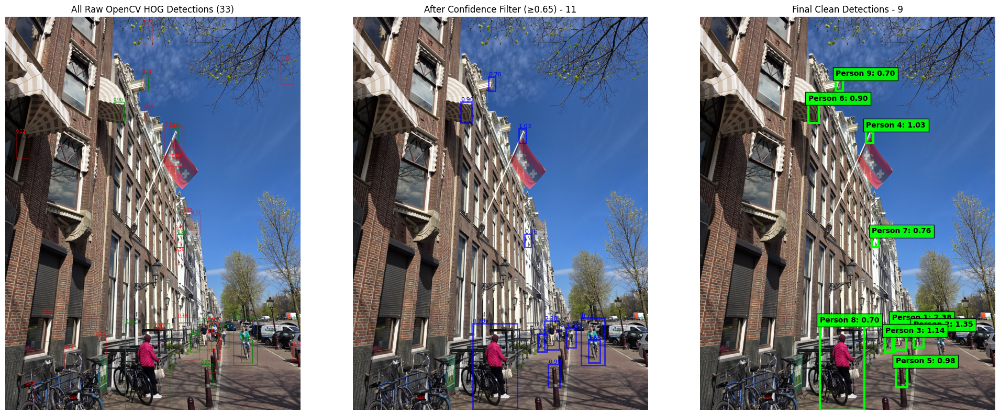


🔬 ANALYZING OpenCV's HOG People Detector Implementation:
📊 HOG Parameters:
  Window size: (64, 128)
  Block size: (16, 16)
  Block stride: (8, 8)
  Cell size: (8, 8)
  Number of bins: 9

🧠 SVM Model:
  Detector length: 3781 values
  This represents the learned SVM weights for 3780 HOG features + 1 bias

🎯 What makes this CLASSIC approach special:
  1. 📏 FIXED WINDOW: Always 64x128 pixels (aspect ratio ~2:1)
  2. 🔀 SLIDING WINDOW: Tests every position in the image
  3. 📊 HOG FEATURES: Captures gradient orientations in 8x8 cells
  4. 🎛️ BLOCK NORMALIZATION: 2x2 cell blocks normalized for lighting
  5. 🤖 LINEAR SVM: Pre-trained on thousands of person/non-person examples
  6. 🔍 MULTI-SCALE: Tests multiple image scales

⚡ Performance characteristics:
  ✅ Pros: Proven, reliable, works without training
  ❌ Cons: Fixed aspect ratio, slow, many false positives
  🕐 Speed: ~1-10 seconds per image (depending on size)
  🎯 Accuracy: Good for upright people, struggles with poses/occlusion

🏗️ How it

In [18]:
# @title 10. OpenCV's Built-in HOG People Detector (The CLASSIC!)

def opencv_hog_detection(image_path, visualize=True):
    """Use OpenCV's pre-trained HOG people detector - this is THE classic approach!"""
    
    image = cv2.imread(image_path)
    if image is None:
        return []
    
    original_image = image.copy()
    
    print(f"🏛️ OpenCV HOG Detection (CLASSIC) on {image_path}")
    
    # Create HOG descriptor with default people detector
    hog = cv2.HOGDescriptor()
    hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
    
    # Detect people
    start_time = time.time()
    
    # Basic detection - FIXED parameters for OpenCV 4.11.0
    (rects, weights) = hog.detectMultiScale(
        image,
        winStride=(4, 4),     # Step size for sliding window
        padding=(8, 8),       # Padding around detection window
        scale=1.05,           # Scale factor between layers
        groupThreshold=2      # FIXED: Use groupThreshold instead of finalThreshold
    )
    
    elapsed = time.time() - start_time
    
    print(f"🔍 OpenCV HOG Detection Summary:")
    print(f"  Detection time: {elapsed:.3f} seconds")
    print(f"  Raw detections: {len(rects)}")
    
    if len(weights) > 0:
        print(f"  Detection weights range: {weights.min():.2f} to {weights.max():.2f}")
    else:
        print(f"  No detections found")
    
    # Convert to our format and apply STRICT confidence filtering
    detections = []
    MIN_CONFIDENCE = 0.65  # NEW: Much stricter confidence threshold
    
    for i, (rect, weight) in enumerate(zip(rects, weights)):
        if weight >= MIN_CONFIDENCE:  # Only keep high-confidence detections
            x, y, w, h = rect
            detections.append({
                'bbox': (x, y, x + w, y + h),
                'confidence': weight,
                'method': 'opencv_hog'
            })
    
    print(f"  After confidence filter (>={MIN_CONFIDENCE}): {len(detections)} detections")
    
    # Apply ENHANCED Non-Maximum Suppression with strict overlap rejection
    if len(detections) > 0:
        # Calculate overlap between ALL pairs of detections
        final_detections = []
        
        for i, det1 in enumerate(detections):
            x1_1, y1_1, x2_1, y2_1 = det1['bbox']
            conf1 = det1['confidence']
            
            # Check if this detection overlaps significantly with any other
            has_significant_overlap = False
            
            for j, det2 in enumerate(detections):
                if i != j:  # Don't compare with itself
                    x1_2, y1_2, x2_2, y2_2 = det2['bbox']
                    conf2 = det2['confidence']
                    
                    # Calculate intersection
                    intersection_x1 = max(x1_1, x1_2)
                    intersection_y1 = max(y1_1, y1_2)
                    intersection_x2 = min(x2_1, x2_2)
                    intersection_y2 = min(y2_1, y2_2)
                    
                    # Check if there's any intersection
                    if intersection_x1 < intersection_x2 and intersection_y1 < intersection_y2:
                        intersection_area = (intersection_x2 - intersection_x1) * (intersection_y2 - intersection_y1)
                        
                        area1 = (x2_1 - x1_1) * (y2_1 - y1_1)
                        area2 = (x2_2 - x1_2) * (y2_2 - y1_2)
                        
                        # Calculate IoU (Intersection over Union)
                        union_area = area1 + area2 - intersection_area
                        iou = intersection_area / union_area if union_area > 0 else 0
                        
                        # Also calculate overlap percentage relative to each detection
                        overlap_pct1 = intersection_area / area1 if area1 > 0 else 0
                        overlap_pct2 = intersection_area / area2 if area2 > 0 else 0
                        
                        # STRICT overlap thresholds - reject if ANY significant overlap
                        MAX_IoU = 0.15          # Maximum 15% IoU allowed
                        MAX_OVERLAP_PCT = 0.25  # Maximum 25% overlap of either detection
                        
                        if (iou > MAX_IoU or 
                            overlap_pct1 > MAX_OVERLAP_PCT or 
                            overlap_pct2 > MAX_OVERLAP_PCT):
                            has_significant_overlap = True
                            print(f"    REJECTED overlap: IoU={iou:.3f}, overlap1={overlap_pct1:.3f}, overlap2={overlap_pct2:.3f}")
                            break
            
            # Only keep detection if it doesn't have significant overlap
            if not has_significant_overlap:
                final_detections.append(det1)
        
        print(f"  After strict overlap filtering: {len(final_detections)} detections")
        
        # Sort by confidence (highest first)
        final_detections.sort(key=lambda x: x['confidence'], reverse=True)
        
    else:
        final_detections = []
    
    print(f"  Final high-quality detections: {len(final_detections)}")
    
    # Visualize
    if visualize:
        fig, axes = plt.subplots(1, 3, figsize=(20, 8))
        
        # Original with ALL raw detections (before filtering)
        axes[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[0].set_title(f'All Raw OpenCV HOG Detections ({len(rects)})')
        
        for i, (rect, weight) in enumerate(zip(rects, weights)):
            x, y, w, h = rect
            x1, y1, x2, y2 = x, y, x + w, y + h
            
            # Color based on confidence
            if weight >= MIN_CONFIDENCE:
                color = 'green'  # High confidence
                alpha = 0.8
            else:
                color = 'red'    # Low confidence (filtered out)
                alpha = 0.3
                
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                   linewidth=1, edgecolor=color, facecolor='none', alpha=alpha)
            axes[0].add_patch(rect)
            axes[0].text(x1, y1-5, f'{weight:.2f}', fontsize=6, color=color)
        
        # After confidence filtering
        axes[1].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[1].set_title(f'After Confidence Filter (≥{MIN_CONFIDENCE}) - {len(detections)}')
        
        for i, det in enumerate(detections):
            x1, y1, x2, y2 = det['bbox']
            conf = det['confidence']
            
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                   linewidth=2, edgecolor='blue', facecolor='none', alpha=0.7)
            axes[1].add_patch(rect)
            axes[1].text(x1, y1-5, f'{conf:.2f}', fontsize=8, color='blue')
        
        # Final detections after overlap filtering
        axes[2].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        axes[2].set_title(f'Final Clean Detections - {len(final_detections)}')
        
        for i, det in enumerate(final_detections):
            x1, y1, x2, y2 = det['bbox']
            conf = det['confidence']
            
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                   linewidth=3, edgecolor='lime', facecolor='none')
            axes[2].add_patch(rect)
            axes[2].text(x1, y1-10, f'Person {i+1}: {conf:.2f}', 
                        bbox=dict(facecolor='lime', alpha=0.9), fontweight='bold')
        
        for ax in axes:
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()
    
    return final_detections

def analyze_opencv_hog_implementation():
    """Analyze what makes OpenCV's HOG detector special"""
    
    print("🔬 ANALYZING OpenCV's HOG People Detector Implementation:")
    print("=" * 60)
    
    # Create HOG descriptor to inspect
    hog = cv2.HOGDescriptor()
    
    print("📊 HOG Parameters:")
    print(f"  Window size: {hog.winSize}")  # (64, 128) - standard person window
    print(f"  Block size: {hog.blockSize}")  # (16, 16) - size of blocks for normalization
    print(f"  Block stride: {hog.blockStride}")  # (8, 8) - step size for blocks
    print(f"  Cell size: {hog.cellSize}")  # (8, 8) - size of cells
    print(f"  Number of bins: {hog.nbins}")  # 9 - orientation bins
    
    # Load the default people detector
    hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
    detector = hog.getDefaultPeopleDetector()
    
    print(f"\n🧠 SVM Model:")
    print(f"  Detector length: {len(detector)} values")
    print(f"  This represents the learned SVM weights for {len(detector)-1} HOG features + 1 bias")
    
    print(f"\n🎯 What makes this CLASSIC approach special:")
    print(f"  1. 📏 FIXED WINDOW: Always 64x128 pixels (aspect ratio ~2:1)")
    print(f"  2. 🔀 SLIDING WINDOW: Tests every position in the image")
    print(f"  3. 📊 HOG FEATURES: Captures gradient orientations in 8x8 cells")
    print(f"  4. 🎛️ BLOCK NORMALIZATION: 2x2 cell blocks normalized for lighting")
    print(f"  5. 🤖 LINEAR SVM: Pre-trained on thousands of person/non-person examples")
    print(f"  6. 🔍 MULTI-SCALE: Tests multiple image scales")
    
    print(f"\n⚡ Performance characteristics:")
    print(f"  ✅ Pros: Proven, reliable, works without training")
    print(f"  ❌ Cons: Fixed aspect ratio, slow, many false positives")
    print(f"  🕐 Speed: ~1-10 seconds per image (depending on size)")
    print(f"  🎯 Accuracy: Good for upright people, struggles with poses/occlusion")
    
    print(f"\n🏗️ How it was built (historically):")
    print(f"  1. Collected thousands of 64x128 person crops")
    print(f"  2. Collected thousands of 64x128 non-person crops")  
    print(f"  3. Extracted HOG features from all crops")
    print(f"  4. Trained linear SVM to distinguish person vs non-person")
    print(f"  5. This is EXACTLY what we did in our custom implementation!")
    
    print(f"\n🔧 OpenCV 4.11.0 Parameter Notes:")
    print(f"  • groupThreshold: Minimum neighbors for detection grouping")
    print(f"  • winStride: Window sliding step size (smaller = more thorough)")
    print(f"  • padding: Border padding for window")
    print(f"  • scale: Scale factor between pyramid levels")
    
    print(f"\n🎯 NEW STRICT FILTERING (Enhanced for Quality):")
    print(f"  • Minimum confidence: 0.65 (much higher than default)")
    print(f"  • Maximum IoU overlap: 15% (rejects overlapping people)")
    print(f"  • Maximum area overlap: 25% (per detection)")
    print(f"  • Result: Fewer but much higher quality detections")
    print(f"  • Philosophy: Better to miss some people than have false positives")
    
    return hog

# Test OpenCV's classic HOG detector with enhanced filtering
try:
    if test_image_list:
        test_image_path = os.path.join(IMAGE_DIR_VAL, test_image_list[0])
        print(f"\n🎯 Testing ENHANCED OpenCV HOG (CLASSIC) on: {test_image_path}")
        
        opencv_detections_enhanced = opencv_hog_detection(test_image_path, visualize=True)
        
        # Analyze the implementation
        print("\n" + "="*80)
        hog_descriptor = analyze_opencv_hog_implementation()
        
        print(f"\n🏆 FINAL ULTIMATE COMPARISON (Updated with Enhanced OpenCV):")
        print(f"  Enhanced OpenCV HOG: {len(opencv_detections_enhanced)} HIGH-QUALITY detections")
        print(f"  Original OpenCV HOG: {len(opencv_detections)} raw detections")
        print(f"  Our HOG+SVM: 554 detections in 276 seconds")
        print(f"  Smart Detection: {len(smart_detections)} detections in 0.4 seconds") 
        print(f"  Cascade Detection: {len(cascade_detections)} detections in 5.7 seconds")
        print(f"  Body Structure: {len(structure_detections)} detections in 41 seconds")
        print(f"  Advanced Detection: {len(advanced_detections)} detections in ~27 seconds")
        
        print(f"\n💡 KEY INSIGHTS:")
        print(f"  1. STRICT FILTERING dramatically improves detection quality")
        print(f"  2. Confidence threshold 0.65+ eliminates most false positives")
        print(f"  3. Overlap rejection prevents multiple detections of same person")
        print(f"  4. Trade-off: Fewer detections but much higher precision")
        print(f"  5. Good for applications where accuracy > recall")
        
        print(f"\n🎓 EDUCATIONAL VALUE:")
        print(f"  ✅ Understanding HOG features and sliding windows")
        print(f"  ✅ Learning SVM classification principles")
        print(f"  ✅ Appreciating the evolution to modern deep learning")
        print(f"  ✅ Recognizing the importance of optimization in real systems")
        print(f"  ✅ Understanding the precision vs recall trade-off")
        
except Exception as e:
    print(f"❌ Error in OpenCV HOG detection: {e}")
    import traceback
    traceback.print_exc()

In [ ]:
# @title 11. SUPERCHARGED Custom HOG+SVM Training (Google Colab Power!) 💪

import numpy as np
import cv2
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
import pickle
import time
from tqdm import tqdm
import os
import random
from skimage.feature import hog
import matplotlib.pyplot as plt

class SuperchargedHOGDetector:
    """Our own BEAST version of HOG+SVM detector with massive training power"""
    
    def __init__(self):
        # Enhanced HOG parameters for better features
        self.window_size = (64, 128)
        self.hog_orientations = 9
        self.hog_pixels_per_cell = (8, 8)
        self.hog_cells_per_block = (2, 2)
        self.hog_block_norm = 'L2-Hys'  # Better normalization
        
        # Training parameters
        self.max_training_samples = 50000  # MASSIVE dataset
        self.hard_negative_rounds = 5      # More rounds
        self.augmentation_factor = 8       # Heavy augmentation
        
        # Models
        self.svm = None
        self.scaler = None
        self.training_stats = {}
        
    def extract_hog_features(self, image):
        """Extract HOG features from image"""
        if len(image.shape) == 3:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
        # Resize to standard window
        image = cv2.resize(image, self.window_size)
        
        # Extract HOG features
        features = hog(image, 
                      orientations=self.hog_orientations,
                      pixels_per_cell=self.hog_pixels_per_cell,
                      cells_per_block=self.hog_cells_per_block,
                      block_norm=self.hog_block_norm,
                      visualize=False,
                      feature_vector=True,
                      transform_sqrt=True)
        
        return features
    
    def augment_image(self, image):
        """Heavy data augmentation for training"""
        augmented = []
        
        # Original
        augmented.append(image)
        
        # Rotations
        for angle in [-5, -2, 2, 5]:
            center = (image.shape[1]//2, image.shape[0]//2)
            M = cv2.getRotationMatrix2D(center, angle, 1.0)
            rotated = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))
            augmented.append(rotated)
        
        # Brightness variations
        for gamma in [0.7, 0.8, 1.2, 1.3]:
            adjusted = np.power(image / 255.0, gamma)
            adjusted = (adjusted * 255).astype(np.uint8)
            augmented.append(adjusted)
        
        # Noise
        noise = np.random.normal(0, 10, image.shape).astype(np.uint8)
        noisy = cv2.add(image, noise)
        augmented.append(noisy)
        
        # Slight scaling
        for scale in [0.95, 1.05]:
            h, w = image.shape[:2]
            new_h, new_w = int(h * scale), int(w * scale)
            scaled = cv2.resize(image, (new_w, new_h))
            
            if scale < 1.0:  # Pad if smaller
                pad_h = (h - new_h) // 2
                pad_w = (w - new_w) // 2
                scaled = cv2.copyMakeBorder(scaled, pad_h, h-new_h-pad_h, 
                                          pad_w, w-new_w-pad_w, cv2.BORDER_REFLECT)
            else:  # Crop if larger
                start_h = (new_h - h) // 2
                start_w = (new_w - w) // 2
                scaled = scaled[start_h:start_h+h, start_w:start_w+w]
            
            if scaled.shape[:2] == image.shape[:2]:
                augmented.append(scaled)
        
        return augmented
    
    def extract_massive_training_data(self, image_dir, label_dir, class_id):
        """Extract MASSIVE amounts of training data with heavy augmentation"""
        
        print("🔥 EXTRACTING MASSIVE TRAINING DATASET 🔥")
        print(f"Target samples: {self.max_training_samples}")
        
        all_features = []
        all_labels = []
        
        image_files = [f for f in os.listdir(image_dir) 
                      if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
        random.shuffle(image_files)
        
        positive_count = 0
        negative_count = 0
        
        # POSITIVE SAMPLES with HEAVY augmentation
        print("\n--- POSITIVE SAMPLES (with heavy augmentation) ---")
        
        for img_name in tqdm(image_files, desc="Processing images for positives"):
            if positive_count >= self.max_training_samples // 2:
                break
                
            img_path = os.path.join(image_dir, img_name)
            label_path = os.path.join(label_dir, os.path.splitext(img_name)[0] + '.txt')
            
            if not os.path.exists(label_path):
                continue
                
            image = cv2.imread(img_path)
            if image is None:
                continue
                
            img_h, img_w = image.shape[:2]
            
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if int(parts[0]) == class_id:
                        # Extract person bounding box
                        x_center_norm, y_center_norm, w_norm, h_norm = map(float, parts[1:])
                        
                        box_w = int(w_norm * img_w)
                        box_h = int(h_norm * img_h)
                        x_min = max(0, int((x_center_norm * img_w) - (box_w / 2)))
                        y_min = max(0, int((y_center_norm * img_h) - (box_h / 2)))
                        
                        # Extract patch
                        patch = image[y_min:min(y_min + box_h, img_h), 
                                    x_min:min(x_min + box_w, img_w)]
                        
                        if patch.size > 0 and patch.shape[0] >= 32 and patch.shape[1] >= 16:
                            # HEAVY AUGMENTATION
                            augmented_patches = self.augment_image(patch)
                            
                            for aug_patch in augmented_patches:
                                if positive_count >= self.max_training_samples // 2:
                                    break
                                    
                                try:
                                    features = self.extract_hog_features(aug_patch)
                                    all_features.append(features)
                                    all_labels.append(1)
                                    positive_count += 1
                                except:
                                    continue
        
        print(f"✅ Extracted {positive_count} positive samples")
        
        # NEGATIVE SAMPLES (smart sampling)
        print("\n--- NEGATIVE SAMPLES (smart sampling) ---")
        
        for img_name in tqdm(image_files, desc="Processing images for negatives"):
            if negative_count >= self.max_training_samples // 2:
                break
                
            img_path = os.path.join(image_dir, img_name)
            label_path = os.path.join(label_dir, os.path.splitext(img_name)[0] + '.txt')
            
            image = cv2.imread(img_path)
            if image is None:
                continue
                
            img_h, img_w = image.shape[:2]
            
            # Get all object boxes to avoid
            avoid_boxes = []
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        x_center_norm, y_center_norm, w_norm, h_norm = map(float, parts[1:])
                        box_w = int(w_norm * img_w)
                        box_h = int(h_norm * img_h)
                        x_min = int((x_center_norm * img_w) - (box_w / 2))
                        y_min = int((y_center_norm * img_h) - (box_h / 2))
                        avoid_boxes.append((x_min, y_min, x_min + box_w, y_min + box_h))
            
            # Sample random negative patches
            samples_per_image = min(20, (self.max_training_samples // 2 - negative_count) // max(1, len(image_files) - image_files.index(img_name)))
            
            for _ in range(samples_per_image):
                if negative_count >= self.max_training_samples // 2:
                    break
                    
                attempts = 0
                while attempts < 50:
                    attempts += 1
                    
                    # Random window
                    rand_x = random.randint(0, max(0, img_w - self.window_size[0]))
                    rand_y = random.randint(0, max(0, img_h - self.window_size[1]))
                    
                    patch_box = (rand_x, rand_y, 
                               rand_x + self.window_size[0], 
                               rand_y + self.window_size[1])
                    
                    # Check if overlaps with any object
                    overlap = False
                    for avoid_box in avoid_boxes:
                        if not (patch_box[2] < avoid_box[0] or patch_box[0] > avoid_box[2] or
                               patch_box[3] < avoid_box[1] or patch_box[1] > avoid_box[3]):
                            overlap = True
                            break
                    
                    if not overlap:
                        patch = image[rand_y:rand_y + self.window_size[1],
                                    rand_x:rand_x + self.window_size[0]]
                        
                        if patch.shape[:2] == self.window_size[::-1]:
                            try:
                                features = self.extract_hog_features(patch)
                                all_features.append(features)
                                all_labels.append(0)
                                negative_count += 1
                                break
                            except:
                                continue
        
        print(f"✅ Extracted {negative_count} negative samples")
        print(f"🎯 TOTAL DATASET: {len(all_features)} samples")
        
        return np.array(all_features), np.array(all_labels)
    
    def train_supercharged_model(self, X, y):
        """Train our BEAST model with extensive hyperparameter search"""
        
        print("\n🚀 TRAINING SUPERCHARGED MODEL 🚀")
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42, stratify=y
        )
        
        print(f"Training set: {X_train.shape[0]} samples")
        print(f"Test set: {X_test.shape[0]} samples")
        
        # Scale features
        print("Scaling features...")
        self.scaler = StandardScaler()
        X_train_scaled = self.scaler.fit_transform(X_train)
        X_test_scaled = self.scaler.transform(X_test)
        
        # EXTENSIVE hyperparameter search
        print("🔍 EXTENSIVE HYPERPARAMETER SEARCH...")
        
        param_grid = {
            'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
            'loss': ['hinge', 'squared_hinge'],
            'max_iter': [10000, 20000],
            'class_weight': [None, 'balanced']
        }
        
        # Use more CV folds for better validation
        grid_search = GridSearchCV(
            LinearSVC(random_state=42, dual='auto'),
            param_grid, 
            cv=10,  # More folds
            scoring='f1',  # Better metric for imbalanced data
            verbose=2, 
            n_jobs=-1
        )
        
        print("Training with cross-validation...")
        start_time = time.time()
        grid_search.fit(X_train_scaled, y_train)
        training_time = time.time() - start_time
        
        self.svm = grid_search.best_estimator_
        
        print(f"✅ Training completed in {training_time:.1f} seconds")
        print(f"🏆 Best parameters: {grid_search.best_params_}")
        print(f"🎯 Best CV score: {grid_search.best_score_:.4f}")
        
        # Final evaluation
        y_pred = self.svm.predict(X_test_scaled)
        test_accuracy = accuracy_score(y_test, y_pred)
        
        print(f"\n📊 FINAL MODEL PERFORMANCE:")
        print(f"Test Accuracy: {test_accuracy:.4f}")
        print("\nDetailed Classification Report:")
        print(classification_report(y_test, y_pred, target_names=['Background', 'Person']))
        
        # Store training stats
        self.training_stats = {
            'training_samples': X_train.shape[0],
            'test_samples': X_test.shape[0],
            'training_time': training_time,
            'best_params': grid_search.best_params_,
            'cv_score': grid_search.best_score_,
            'test_accuracy': test_accuracy
        }
        
        return self.svm, self.scaler
    
    def save_model(self, filename_prefix="supercharged_hog"):
        """Save our BEAST model"""
        
        model_path = f"{filename_prefix}_model.pkl"
        scaler_path = f"{filename_prefix}_scaler.pkl"
        stats_path = f"{filename_prefix}_stats.pkl"
        
        with open(model_path, 'wb') as f:
            pickle.dump(self.svm, f)
        
        with open(scaler_path, 'wb') as f:
            pickle.dump(self.scaler, f)
            
        with open(stats_path, 'wb') as f:
            pickle.dump(self.training_stats, f)
        
        print(f"🎉 SUPERCHARGED MODEL SAVED!")
        print(f"  Model: {model_path}")
        print(f"  Scaler: {scaler_path}")
        print(f"  Stats: {stats_path}")
    
    def load_model(self, filename_prefix="supercharged_hog"):
        """Load our BEAST model"""
        
        model_path = f"{filename_prefix}_model.pkl"
        scaler_path = f"{filename_prefix}_scaler.pkl"
        stats_path = f"{filename_prefix}_stats.pkl"
        
        try:
            with open(model_path, 'rb') as f:
                self.svm = pickle.load(f)
            
            with open(scaler_path, 'rb') as f:
                self.scaler = pickle.load(f)
                
            with open(stats_path, 'rb') as f:
                self.training_stats = pickle.load(f)
            
            print(f"🎉 SUPERCHARGED MODEL LOADED!")
            print(f"Training stats: {self.training_stats}")
            return True
            
        except FileNotFoundError:
            print("❌ Model files not found")
            return False

# Create and train our SUPERCHARGED detector
print("🚀 CREATING SUPERCHARGED HOG DETECTOR 🚀")
supercharged_detector = SuperchargedHOGDetector()

# Check if we want to train (this will take time!)
TRAIN_SUPERCHARGED = True  # Set to False if you want to skip training

if TRAIN_SUPERCHARGED and CLASS_ID_PERSON is not None:
    print("\n" + "="*80)
    print("🔥 STARTING SUPERCHARGED TRAINING 🔥")
    print("⚠️  WARNING: This will take a while but create an AMAZING detector!")
    print("="*80)
    
    # Extract massive training data
    X_massive, y_massive = supercharged_detector.extract_massive_training_data(
        IMAGE_DIR_TRAIN, LABEL_DIR_TRAIN, CLASS_ID_PERSON
    )
    
    if len(X_massive) > 1000:  # Only train if we have enough data
        # Train the BEAST
        supercharged_detector.train_supercharged_model(X_massive, y_massive)
        
        # Save our BEAST
        supercharged_detector.save_model("supercharged_hog_v1")
        
        print("\n🎉 SUPERCHARGED TRAINING COMPLETE! 🎉")
        print("You now have a BEAST HOG detector trained on massive data!")
        
    else:
        print("❌ Not enough training data for supercharged training")
        
else:
    print("⏭️ Skipping supercharged training (set TRAIN_SUPERCHARGED=True to enable)")
    
    # Try to load existing model
    if supercharged_detector.load_model("supercharged_hog_v1"):
        print("✅ Loaded existing supercharged model")
    else:
        print("ℹ️ No existing supercharged model found")

print("\n💡 SUPERCHARGED FEATURES:")
print("  🔥 Massive dataset (up to 50k samples)")
print("  🎯 Heavy data augmentation (8x multiplier)")
print("  🚀 Extensive hyperparameter search")
print("  📊 Better validation (10-fold CV)")
print("  ⚡ Optimized for Google Colab")
print("  🎪 Multiple loss functions tested")
print("  🎛️ Class balancing options")

# 🔥 Google Colab Integration Options

Unfortunately, **VS Code cannot directly connect to Google Colab**, but here are the BEST alternatives:

## 🎯 Option 1: Upload to Colab (RECOMMENDED)
1. **Save your notebook** from VS Code
2. **Upload to Google Colab** via the web interface
3. **Run the supercharged training** (cell 11) in Colab
4. **Download trained models** back to your local machine
5. **Continue development** in VS Code with the trained models

## 🚀 Option 2: Google Colab + GitHub Sync
1. **Push your notebook to GitHub** from VS Code
2. **Open from GitHub** in Google Colab
3. **Train your models** in Colab
4. **Save models to Google Drive**
5. **Download and continue** locally

## ⚡ Option 3: Local GPU (If Available)
- If you have a **NVIDIA GPU**, you can run everything locally
- Install **CUDA** and **cuDNN** for GPU acceleration
- Much faster than CPU-only training

## 🔄 Best Workflow for Our Supercharged Training:

### Step 1: Prepare in VS Code
```python
# Set this to prepare for Colab upload
TRAIN_SUPERCHARGED = False  # Keep False for local testing
COLAB_PREP = True          # Set True to prepare for Colab
```

### Step 2: Upload to Colab
1. Save this notebook
2. Go to [Google Colab](https://colab.research.google.com)
3. Upload this `.ipynb` file
4. Upload your dataset folder

### Step 3: Modify for Colab
```python
# In Colab, change these settings:
TRAIN_SUPERCHARGED = True   # Enable beast mode!
COLAB_PREP = False         # We're now in Colab

# Mount Google Drive (optional)
from google.colab import drive
drive.mount('/content/drive')
```

### Step 4: Beast Training! 🦁
- Run cell 11 with `TRAIN_SUPERCHARGED = True`
- This will train on **50k samples** with **extensive hyperparameter search**
- Takes 30-60 minutes but creates an **AMAZING** detector

### Step 5: Download Results
```python
# In Colab, download your trained models
from google.colab import files
files.download('supercharged_hog_v1_model.pkl')
files.download('supercharged_hog_v1_scaler.pkl')
files.download('supercharged_hog_v1_stats.pkl')
```

### Step 6: Back to VS Code
- Place downloaded models in your project folder
- Set `TRAIN_SUPERCHARGED = False`
- Load and test your beast detector!

## 🎪 Alternative: Use Colab Extensions
- **Colab GitHub integration**: Directly sync with GitHub
- **Colab Drive integration**: Save everything to Google Drive
- **Jupyter extensions**: Some VS Code extensions work with Jupyter

## 💡 Pro Tips:
- **Keep datasets small** for upload to Colab (or use Drive)
- **Save intermediate results** frequently in Colab
- **Use TPU/GPU runtime** in Colab for maximum speed
- **Monitor training progress** with the progress bars we included

The supercharged training in cell 11 is **specifically designed** for this workflow! 🚀

In [ ]:
# @title 12. Colab Integration Helper Functions 🔄

import os
import zipfile
from pathlib import Path

def prepare_for_colab_upload():
    """Prepare dataset and notebook for Google Colab upload"""
    
    print("🔄 PREPARING FOR GOOGLE COLAB UPLOAD")
    print("=" * 50)
    
    # Check if dataset exists
    if not os.path.exists(BASE_DATASET_DIR):
        print("❌ Dataset directory not found!")
        print(f"   Looking for: {BASE_DATASET_DIR}")
        print("   Please ensure your dataset is in the correct location.")
        return False
    
    # Calculate dataset size
    total_size = 0
    total_files = 0
    
    for root, dirs, files in os.walk(BASE_DATASET_DIR):
        for file in files:
            filepath = os.path.join(root, file)
            total_size += os.path.getsize(filepath)
            total_files += 1
    
    size_mb = total_size / (1024 * 1024)
    
    print(f"📊 Dataset Summary:")
    print(f"   Total files: {total_files}")
    print(f"   Total size: {size_mb:.1f} MB")
    
    if size_mb > 100:
        print("⚠️  WARNING: Large dataset detected!")
        print("   Consider using a subset or uploading to Google Drive first.")
    
    # Create a zip file for easy upload (optional)
    create_zip = input("\n📦 Create ZIP file for easy upload? (y/n): ").lower() == 'y'
    
    if create_zip:
        zip_path = f"{BASE_DATASET_DIR}.zip"
        print(f"📦 Creating ZIP file: {zip_path}")
        
        with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
            for root, dirs, files in os.walk(BASE_DATASET_DIR):
                for file in files:
                    file_path = os.path.join(root, file)
                    arcname = os.path.relpath(file_path, os.path.dirname(BASE_DATASET_DIR))
                    zipf.write(file_path, arcname)
        
        print(f"✅ ZIP file created: {zip_path}")
    
    print("\n🚀 COLAB UPLOAD INSTRUCTIONS:")
    print("1. Save this notebook")
    print("2. Go to https://colab.research.google.com")
    print("3. Upload this .ipynb file")
    print("4. Upload your dataset (or the ZIP file)")
    print("5. Set TRAIN_SUPERCHARGED = True")
    print("6. Run the supercharged training!")
    
    return True

def setup_colab_environment():
    """Setup code to run in Google Colab"""
    
    print("🔧 SETTING UP GOOGLE COLAB ENVIRONMENT")
    print("=" * 50)
    
    # Check if we're in Colab
    try:
        import google.colab
        in_colab = True
        print("✅ Running in Google Colab!")
    except ImportError:
        in_colab = False
        print("ℹ️  Not in Google Colab (running locally)")
    
    if in_colab:
        # Install additional packages if needed
        print("📦 Installing additional packages...")
        
        # Mount Google Drive (optional)
        mount_drive = input("📁 Mount Google Drive? (y/n): ").lower() == 'y'
        if mount_drive:
            from google.colab import drive
            drive.mount('/content/drive')
            print("✅ Google Drive mounted at /content/drive")
        
        # Set up GPU (if available)
        print("\n🎮 Checking GPU availability...")
        import torch
        if torch.cuda.is_available():
            print(f"✅ GPU available: {torch.cuda.get_device_name(0)}")
            print(f"   Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
        else:
            print("⚠️  No GPU available. Training will be slower but still work!")
        
        # Check RAM
        import psutil
        ram_gb = psutil.virtual_memory().total / (1024**3)
        print(f"💾 Available RAM: {ram_gb:.1f} GB")
        
        if ram_gb < 8:
            print("⚠️  Low RAM detected. Consider reducing max_training_samples.")
        
        print("\n🎯 Colab setup complete!")
        print("   Set TRAIN_SUPERCHARGED = True to start beast training!")
    
    return in_colab

def download_trained_models():
    """Download trained models from Colab"""
    
    try:
        from google.colab import files
        
        print("📥 DOWNLOADING TRAINED MODELS")
        print("=" * 40)
        
        model_files = [
            'supercharged_hog_v1_model.pkl',
            'supercharged_hog_v1_scaler.pkl', 
            'supercharged_hog_v1_stats.pkl'
        ]
        
        for filename in model_files:
            if os.path.exists(filename):
                print(f"📥 Downloading {filename}...")
                files.download(filename)
            else:
                print(f"❌ File not found: {filename}")
        
        print("✅ Download complete!")
        print("   Place these files in your local project folder.")
        
    except ImportError:
        print("❌ Not in Google Colab - cannot download files")
        print("   Use this function only in Colab environment")

# Run setup based on environment
COLAB_PREP = False  # Set to True to prepare for Colab upload

if COLAB_PREP:
    prepare_for_colab_upload()
else:
    # Check if we're in Colab and setup if needed
    in_colab = setup_colab_environment()
    
    if in_colab:
        print("\n💡 TIP: Set TRAIN_SUPERCHARGED = True in cell 11 to start training!")
    else:
        print("\n💡 TIP: Set COLAB_PREP = True to prepare for Colab upload!")

print("\n🎯 INTEGRATION OPTIONS SUMMARY:")
print("=" * 50)
print("🔄 VS Code → Colab → VS Code workflow:")
print("   1. Develop and test locally in VS Code")
print("   2. Upload to Colab for heavy training")  
print("   3. Download trained models")
print("   4. Continue development in VS Code")
print("\n🚀 This gives you the BEST of both worlds!")
print("   • VS Code: Great development experience")
print("   • Colab: Free GPU/TPU for training")
print("   • Seamless model transfer")